# Airplane_Crashes network

###### Installazione importazioni librerie

In [1]:
import pandas as pd
import re
import matplotlib as mlt
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.axes as axes
import math
#!{sys.executable} -m pip install seaborn
import seaborn as sb
import networkx as nx

#### Importazione e osservazione dataset Airplane_crashes


In [2]:
dataset = pd.read_csv("datasets/Airplane_Crashes_and_Fatalities_Since_1908_20190820105639.csv")
dataset

,Date,Time,Location,Operator,Flight #,Route,AC Type,Registration,cn/ln,Aboard,Aboard Passangers,Aboard Crew,Fatalities,Fatalities Passangers,Fatalities Crew,Ground,Summary
0,09/17/1908,17:18,"Fort Myer, Virginia",Military - U.S. Army,NaN,Demonstration,Wright Flyer III,NaN,1,2.0,1.0,1.0,1.0,1.0,0.0,0.0,"During a demonstration flight, a U.S. Army fly..."
1,09/07/1909,NaN,"Juvisy-sur-Orge, France",NaN,NaN,Air show,Wright Byplane,SC1,NaN,1.0,0.0,1.0,1.0,0.0,0.0,0.0,Eugene Lefebvre was the first pilot to ever be...
2,07/12/1912,06:30,"Atlantic City, New Jersey",Military - U.S. Navy,NaN,Test flight,Dirigible,NaN,NaN,5.0,0.0,5.0,5.0,0.0,5.0,0.0,First U.S. dirigible Akron exploded just offsh...
3,08/06/1913,NaN,"Victoria, British Columbia, Canada",Private,NaN,NaN,Curtiss seaplane,NaN,NaN,1.0,0.0,1.0,1.0,0.0,1.0,0.0,The first fatal airplane accident in Canada oc...
4,09/09/1913,18:30,Over the North Sea,Military - German Navy,NaN,NaN,Zeppelin L-1 (airship),NaN,NaN,20.0,NaN,NaN,14.0,NaN,NaN,0.0,The airship flew into a thunderstorm and encou...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4962,04/16/2019,11:00,"Puerto Montt, Chile",Archipelagos Service Aereos,NaN,Puerto Montt - Ayacara,Pilatus-Britten Norman BN-2B-27 Islander,CC-CYR,2169,6.0,5.0,1.0,6.0,5.0,1.0,0.0,"While the aircraft was in the initial climb, p..."
4963,05/05/2019,18:30,"Near Monclava, Mexico",TVPX Aircraft Solutions,NaN,Las Vegas - Monterrey,Canadair CL-600-2B16-Challenger,N601VH,5043,13.0,11.0,2.0,13.0,11.0,2.0,0.0,The aircraft crashed while en route on a retur...
4964,05/05/2019,18:30,"Moscow, Russia",Aeroflot Russian International Airlines,NaN,Moscow - Murmansk,Sukhoi Superjet-100-95B,RA-89098,95135,78.0,73.0,5.0,41.0,40.0,1.0,0.0,Forty-five minutes after taking off from Mosco...
4965,06/03/2019,13:00,"Near Lipo, India",Military - Indian Air Force,NaN,Jorhat-Rowriah - Mechuka,Antonov An-32,K2752,1009,13.0,5.0,8.0,13.0,5.0,8.0,0.0,Crashed about 34km WNW of Mechuka.


##### Importazione dataset che utilizzeremo successivamente

In [3]:
cities_dataset = pd.read_csv("datasets/cities.csv")
world_cities_dataset = pd.read_csv("datasets/world-cities.csv")

#### Prime rappresentazioni grafiche

##### In questa griglia vengono rappresentante le distribuzioni di :
##### Fatalities - Aboard - Fatalities Crew - Fatalities Passangers

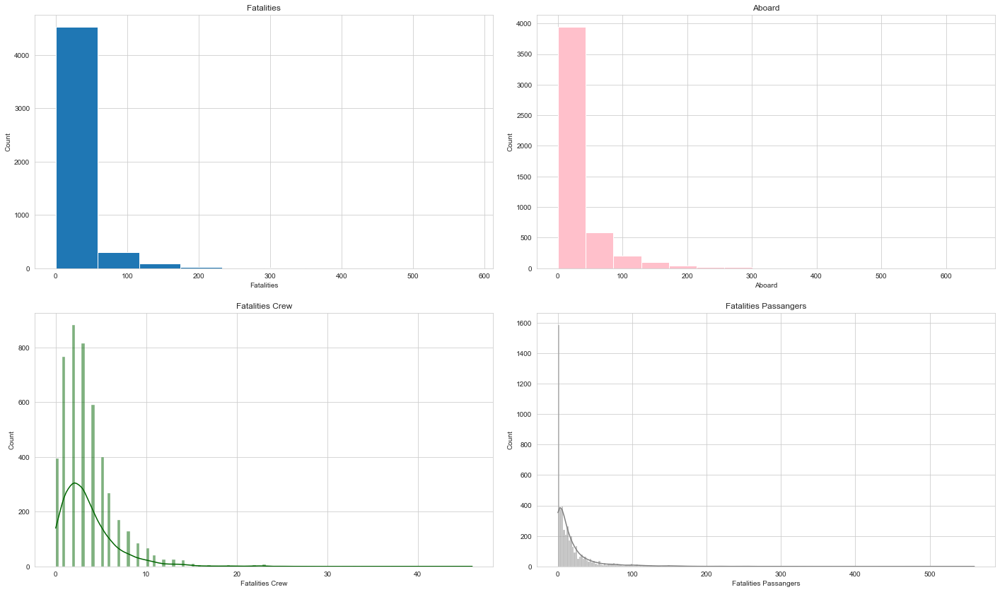

In [4]:
fig, axes = plt.subplots(2, 2, figsize=(20, 12))
plt.grid()
axes[0, 0].hist(dataset['Fatalities'])
axes[0, 0].set_xlabel('Fatalities')
axes[0, 0].set_ylabel('Count')
axes[0, 0].set_title('Fatalities')

axes[0, 1].hist(dataset['Aboard'], bins=15,color="pink")
plt.grid()
axes[0, 1].set_xlabel('Aboard')
axes[0, 1].set_ylabel('Count')
axes[0, 1].set_title('Aboard')

# first two is using a matplotlib syntax, the next two I'll do with seaborn

axes[1, 0].set_title('Fatalities Crew')
plt.grid()
sb.histplot(dataset, x='Fatalities Crew', ax=axes[1, 0], kde=True,color="darkgreen")
axes[1, 0].set_xlabel('Fatalities Crew')
axes[1, 0].set_ylabel('Count')

axes[1, 1].set_title('Fatalities Passangers')
plt.grid()
sb.histplot(dataset, x='Fatalities Passangers', ax=axes[1, 1], kde=True,color="grey")
axes[1, 1].set_xlabel('Fatalities Passangers')
axes[1, 1].set_ylabel('Count')
plt.tight_layout(pad=2)
plt.show()

## Pulizia dataset Airplane_crashes

#### Eliminazione variabili poco rilevanti

In [5]:
col_trash = ['Flight #','Registration','cn/ln','Summary','Time']

dataset_1st = dataset
for col in dataset_1st.columns:
    if col in col_trash:
        dataset_1st = dataset_1st.drop(col, axis=1)

dataset_1st

,Date,Location,Operator,Route,AC Type,Aboard,Aboard Passangers,Aboard Crew,Fatalities,Fatalities Passangers,Fatalities Crew,Ground
0,09/17/1908,"Fort Myer, Virginia",Military - U.S. Army,Demonstration,Wright Flyer III,2.0,1.0,1.0,1.0,1.0,0.0,0.0
1,09/07/1909,"Juvisy-sur-Orge, France",NaN,Air show,Wright Byplane,1.0,0.0,1.0,1.0,0.0,0.0,0.0
2,07/12/1912,"Atlantic City, New Jersey",Military - U.S. Navy,Test flight,Dirigible,5.0,0.0,5.0,5.0,0.0,5.0,0.0
3,08/06/1913,"Victoria, British Columbia, Canada",Private,NaN,Curtiss seaplane,1.0,0.0,1.0,1.0,0.0,1.0,0.0
4,09/09/1913,Over the North Sea,Military - German Navy,NaN,Zeppelin L-1 (airship),20.0,NaN,NaN,14.0,NaN,NaN,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
4962,04/16/2019,"Puerto Montt, Chile",Archipelagos Service Aereos,Puerto Montt - Ayacara,Pilatus-Britten Norman BN-2B-27 Islander,6.0,5.0,1.0,6.0,5.0,1.0,0.0
4963,05/05/2019,"Near Monclava, Mexico",TVPX Aircraft Solutions,Las Vegas - Monterrey,Canadair CL-600-2B16-Challenger,13.0,11.0,2.0,13.0,11.0,2.0,0.0
4964,05/05/2019,"Moscow, Russia",Aeroflot Russian International Airlines,Moscow - Murmansk,Sukhoi Superjet-100-95B,78.0,73.0,5.0,41.0,40.0,1.0,0.0
4965,06/03/2019,"Near Lipo, India",Military - Indian Air Force,Jorhat-Rowriah - Mechuka,Antonov An-32,13.0,5.0,8.0,13.0,5.0,8.0,0.0


#### Osservazione presenza Na e gestione degli Na

###### Cleaning colonna **Operator**

In [6]:
print("numero di Na:", len([i for i in dataset_1st.Operator if type(i) == float]))  # abbiamo solo 10 Na
print(dataset_1st.shape)
# Eliminazione righe contenenti Na nella colonna Operator
dataset_1st = dataset_1st[dataset_1st['Operator'].notna()]
print(dataset_1st.shape)

numero di Na: 10
(4967, 12)
(4957, 12)


In [7]:
print("numero di NaN nella colonna Route:",
      len([i for i in dataset_1st.Route if type(i) == float]))  # 770.. da gestire

numero di NaN nella colonna Route: 770


##### Controllo valori nulli delle colonne:
- Aboard
- Aboard Crew
- Aboard Passangers
- Fatalities
- Fatalities Crew
- Fatalities Passangers
- Ground

In [8]:
def na_counter_for_numeric_column(column, nome_colonna):
    nas = []
    for value in column:
        try:
            int(value)
        except:
            nas.append(value)
    return print(f"Numero di Na della colonna {nome_colonna}: {len(nas)}")


na_counter_for_numeric_column(dataset_1st["Aboard"], "Aboard")
na_counter_for_numeric_column(dataset_1st["Aboard Crew"], "Aboard Crew")
na_counter_for_numeric_column(dataset_1st["Aboard Passangers"], "Aboard Passangers")
na_counter_for_numeric_column(dataset_1st["Fatalities"], "Fatalities")
na_counter_for_numeric_column(dataset_1st["Fatalities Crew"], "Fatalities Crew")
na_counter_for_numeric_column(dataset_1st["Fatalities Passangers"], "Fatalities Passangers")
na_counter_for_numeric_column(dataset_1st["Ground"], "Ground")

Numero di Na della colonna Aboard: 18
Numero di Na della colonna Aboard Crew: 223
Numero di Na della colonna Aboard Passangers: 226
Numero di Na della colonna Fatalities: 8
Numero di Na della colonna Fatalities Crew: 238
Numero di Na della colonna Fatalities Passangers: 239
Numero di Na della colonna Ground: 40


##### Check degli NA nella colonna Location


In [9]:
print("numero di NaN nella colonna Location:", len([i for i in dataset.Location if type(i) == float]))  # Non abbiamo NA

numero di NaN nella colonna Location: 4


### Gestione variabili e creazione nuove variabili per implementare l’analisi

#### Identificazione e raggruppamento categoria di operatore militare

In [10]:
print("numero di operatori univoci:", len(dataset_1st['Operator'].unique()))

military_flights = []

military_words = ["army", "navy", "marine", "military", "force", "airforce", "amee de l'air", "mission"]

# Identifica tutti i nomi degli operatori che appartengono al campo militare
for operator in dataset_1st['Operator'].unique():
    for word in military_words:
        if word.lower() in operator.lower() and operator not in military_flights:
            military_flights.append(operator)

print("numero di operatori militari univoci:", len(military_flights))  # 251 valori univoci relativi

numero di operatori univoci: 2242
numero di operatori militari univoci: 256


#### Identificazione e raggruppamento categoria di operatore postale

In [11]:
postal_cargo_flights = []

postal_e_cargo_words = ["postal", "mail", "aeropostale", "cargo", "express", "commercial"]

# Identifica tutti i nomi degli operatori che appartengono al campo militare
for operator in dataset_1st['Operator'].unique():
    if type(operator) != float:
        for word in postal_e_cargo_words:
            if word.lower() in operator.lower() and operator not in postal_cargo_flights: postal_cargo_flights.append(
                operator)

print("numero di operatori postali/cargo univoci:", len(postal_cargo_flights))

numero di operatori postali/cargo univoci: 85


#### Identificazione e raggruppamento categoria di operatori privati

In [12]:
private_flights = []

private_words = ["priva"]

# Identifica tutti i nomi degli operatori che appartengono al campo militare
for operator in dataset_1st['Operator'].unique():
    if type(operator) != float:
        for word in private_words:
            if word.lower() in operator.lower() and operator not in private_flights: private_flights.append(operator)

print("numero di operatori privati:", len(private_flights))

numero di operatori privati: 45


#### Aggiunta valori per le nuove colonne

In [13]:
new_column = []

for value in dataset_1st.Operator:
    if value in military_flights:
        new_column.append("Military flight")
    elif value in postal_cargo_flights:
        new_column.append("Postal/Cargo flight")
    elif value in private_flights:
        new_column.append("Private flights")
    else:
        new_column.append("Scheduled flight")

In [14]:
dataset_1st = dataset_1st.assign(New_Operator_column=new_column)
dataset_1st

,Date,Location,Operator,Route,AC Type,Aboard,Aboard Passangers,Aboard Crew,Fatalities,Fatalities Passangers,Fatalities Crew,Ground,New_Operator_column
0,09/17/1908,"Fort Myer, Virginia",Military - U.S. Army,Demonstration,Wright Flyer III,2.0,1.0,1.0,1.0,1.0,0.0,0.0,Military flight
2,07/12/1912,"Atlantic City, New Jersey",Military - U.S. Navy,Test flight,Dirigible,5.0,0.0,5.0,5.0,0.0,5.0,0.0,Military flight
3,08/06/1913,"Victoria, British Columbia, Canada",Private,NaN,Curtiss seaplane,1.0,0.0,1.0,1.0,0.0,1.0,0.0,Private flights
4,09/09/1913,Over the North Sea,Military - German Navy,NaN,Zeppelin L-1 (airship),20.0,NaN,NaN,14.0,NaN,NaN,0.0,Military flight
5,10/17/1913,"Near Johannisthal, Germany",Military - German Navy,NaN,Zeppelin L-2 (airship),30.0,NaN,NaN,30.0,NaN,NaN,0.0,Military flight
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4962,04/16/2019,"Puerto Montt, Chile",Archipelagos Service Aereos,Puerto Montt - Ayacara,Pilatus-Britten Norman BN-2B-27 Islander,6.0,5.0,1.0,6.0,5.0,1.0,0.0,Scheduled flight
4963,05/05/2019,"Near Monclava, Mexico",TVPX Aircraft Solutions,Las Vegas - Monterrey,Canadair CL-600-2B16-Challenger,13.0,11.0,2.0,13.0,11.0,2.0,0.0,Scheduled flight
4964,05/05/2019,"Moscow, Russia",Aeroflot Russian International Airlines,Moscow - Murmansk,Sukhoi Superjet-100-95B,78.0,73.0,5.0,41.0,40.0,1.0,0.0,Scheduled flight
4965,06/03/2019,"Near Lipo, India",Military - Indian Air Force,Jorhat-Rowriah - Mechuka,Antonov An-32,13.0,5.0,8.0,13.0,5.0,8.0,0.0,Military flight


#### Aggiunta colonna Aeroporto_di_partenza

In [15]:
rotte = []

for position, route in enumerate(dataset_1st.Route):
    if type(route) != float:
        rotte.append(route.split(" - "))
    else:
        rotte.append(route)

rotte_pulite = []
for position, route in enumerate(rotte):
    new_route = []
    if type(route) != float:
        for aeroport in route:
            if "," in aeroport:
                new_route.append(re.sub(f",.+", "", aeroport).strip())
            else:
                new_route.append(aeroport)
    elif type(route) == float and dataset_1st["New_Operator_column"].iloc[position] == "Military flight":
        new_route.append("Informazione riservata")
    else:
        new_route.append("Sconosciuto")
    rotte_pulite.append(new_route)

#print(rotte_pulite)
#for i in rotte_pulite:
    #print(i)

In [16]:
aeroporto_partenza = [aeroporto[0] for aeroporto in rotte_pulite]
dataset_1st = dataset_1st.assign(Aeroporto_di_partenza=aeroporto_partenza)

dataset_1st

,Date,Location,Operator,Route,AC Type,Aboard,Aboard Passangers,Aboard Crew,Fatalities,Fatalities Passangers,Fatalities Crew,Ground,New_Operator_column,Aeroporto_di_partenza
0,09/17/1908,"Fort Myer, Virginia",Military - U.S. Army,Demonstration,Wright Flyer III,2.0,1.0,1.0,1.0,1.0,0.0,0.0,Military flight,Demonstration
2,07/12/1912,"Atlantic City, New Jersey",Military - U.S. Navy,Test flight,Dirigible,5.0,0.0,5.0,5.0,0.0,5.0,0.0,Military flight,Test flight
3,08/06/1913,"Victoria, British Columbia, Canada",Private,NaN,Curtiss seaplane,1.0,0.0,1.0,1.0,0.0,1.0,0.0,Private flights,Sconosciuto
4,09/09/1913,Over the North Sea,Military - German Navy,NaN,Zeppelin L-1 (airship),20.0,NaN,NaN,14.0,NaN,NaN,0.0,Military flight,Informazione riservata
5,10/17/1913,"Near Johannisthal, Germany",Military - German Navy,NaN,Zeppelin L-2 (airship),30.0,NaN,NaN,30.0,NaN,NaN,0.0,Military flight,Informazione riservata
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4962,04/16/2019,"Puerto Montt, Chile",Archipelagos Service Aereos,Puerto Montt - Ayacara,Pilatus-Britten Norman BN-2B-27 Islander,6.0,5.0,1.0,6.0,5.0,1.0,0.0,Scheduled flight,Puerto Montt
4963,05/05/2019,"Near Monclava, Mexico",TVPX Aircraft Solutions,Las Vegas - Monterrey,Canadair CL-600-2B16-Challenger,13.0,11.0,2.0,13.0,11.0,2.0,0.0,Scheduled flight,Las Vegas
4964,05/05/2019,"Moscow, Russia",Aeroflot Russian International Airlines,Moscow - Murmansk,Sukhoi Superjet-100-95B,78.0,73.0,5.0,41.0,40.0,1.0,0.0,Scheduled flight,Moscow
4965,06/03/2019,"Near Lipo, India",Military - Indian Air Force,Jorhat-Rowriah - Mechuka,Antonov An-32,13.0,5.0,8.0,13.0,5.0,8.0,0.0,Military flight,Jorhat-Rowriah


#### Aggiunta colonne per aeroporti intermedi
Il numero massimo di aeroporti nelle rotte è 7 quindi andranno create 7 nuove colonne

In [17]:
aeroporto_2 = []
aeroporto_3 = []
aeroporto_4 = []
aeroporto_5 = []
aeroporto_6 = []
ultimo_aeroporto = []


for n_aeroporti in rotte_pulite:
    if len(n_aeroporti) == 1:
        ultimo_aeroporto.append(n_aeroporti)
        aeroporto_2.append("Nan")
        aeroporto_3.append("Nan")
        aeroporto_4.append("Nan")
        aeroporto_5.append("Nan")
        aeroporto_6.append("Nan")
    if len(n_aeroporti) == 2:
        ultimo_aeroporto.append(n_aeroporti[-1])
        aeroporto_2.append("Nan")
        aeroporto_3.append("Nan")
        aeroporto_4.append("Nan")
        aeroporto_5.append("Nan")
        aeroporto_6.append("Nan")
    if len(n_aeroporti) == 3:
        aeroporto_2.append(n_aeroporti[1])
        ultimo_aeroporto.append(n_aeroporti[-1])
        aeroporto_3.append("Nan")
        aeroporto_4.append("Nan")
        aeroporto_5.append("Nan")
        aeroporto_6.append("Nan")
    if len(n_aeroporti) == 4:
        aeroporto_2.append(n_aeroporti[1])
        aeroporto_3.append(n_aeroporti[2])
        ultimo_aeroporto.append(n_aeroporti[-1])
        aeroporto_4.append("Nan")
        aeroporto_5.append("Nan")
        aeroporto_6.append("Nan")
    if len(n_aeroporti) == 5:
        aeroporto_2.append(n_aeroporti[1])
        aeroporto_3.append(n_aeroporti[2])
        aeroporto_4.append(n_aeroporti[3])
        ultimo_aeroporto.append(n_aeroporti[-1])
        aeroporto_5.append("Nan")
        aeroporto_6.append("Nan")
    if len(n_aeroporti) == 6:
        aeroporto_2.append(n_aeroporti[1])
        aeroporto_3.append(n_aeroporti[2])
        aeroporto_4.append(n_aeroporti[3])
        aeroporto_5.append(n_aeroporti[4])
        ultimo_aeroporto.append(n_aeroporti[-1])
        aeroporto_6.append("Nan")
    if len(n_aeroporti) == 7:
        aeroporto_2.append(n_aeroporti[1])
        aeroporto_3.append(n_aeroporti[2])
        aeroporto_4.append(n_aeroporti[3])
        aeroporto_5.append(n_aeroporti[4])
        aeroporto_6.append(n_aeroporti[5])
        ultimo_aeroporto.append(n_aeroporti[-1])

# Alcuni valori di aeroporto_di destinazione erano in una lista. Risolviamo:
for position, aeroporto in enumerate(ultimo_aeroporto):
    if type(aeroporto) == list:
        ultimo_aeroporto[position] = aeroporto[0]

dataset_1st = dataset_1st.assign(Aeroporto_2=aeroporto_2,
                         Aeroporto_3=aeroporto_3,
                         Aeroporto_4=aeroporto_4,
                         Aeroporto_5=aeroporto_5,
                         Aeroporto_6=aeroporto_6,
                         Ultimo_aeroporto=ultimo_aeroporto)

dataset_1st

,Date,Location,Operator,Route,AC Type,Aboard,Aboard Passangers,Aboard Crew,Fatalities,Fatalities Passangers,Fatalities Crew,Ground,New_Operator_column,Aeroporto_di_partenza,Aeroporto_2,Aeroporto_3,Aeroporto_4,Aeroporto_5,Aeroporto_6,Ultimo_aeroporto
0,09/17/1908,"Fort Myer, Virginia",Military - U.S. Army,Demonstration,Wright Flyer III,2.0,1.0,1.0,1.0,1.0,0.0,0.0,Military flight,Demonstration,Nan,Nan,Nan,Nan,Nan,Demonstration
2,07/12/1912,"Atlantic City, New Jersey",Military - U.S. Navy,Test flight,Dirigible,5.0,0.0,5.0,5.0,0.0,5.0,0.0,Military flight,Test flight,Nan,Nan,Nan,Nan,Nan,Test flight
3,08/06/1913,"Victoria, British Columbia, Canada",Private,NaN,Curtiss seaplane,1.0,0.0,1.0,1.0,0.0,1.0,0.0,Private flights,Sconosciuto,Nan,Nan,Nan,Nan,Nan,Sconosciuto
4,09/09/1913,Over the North Sea,Military - German Navy,NaN,Zeppelin L-1 (airship),20.0,NaN,NaN,14.0,NaN,NaN,0.0,Military flight,Informazione riservata,Nan,Nan,Nan,Nan,Nan,Informazione riservata
5,10/17/1913,"Near Johannisthal, Germany",Military - German Navy,NaN,Zeppelin L-2 (airship),30.0,NaN,NaN,30.0,NaN,NaN,0.0,Military flight,Informazione riservata,Nan,Nan,Nan,Nan,Nan,Informazione riservata
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4962,04/16/2019,"Puerto Montt, Chile",Archipelagos Service Aereos,Puerto Montt - Ayacara,Pilatus-Britten Norman BN-2B-27 Islander,6.0,5.0,1.0,6.0,5.0,1.0,0.0,Scheduled flight,Puerto Montt,Nan,Nan,Nan,Nan,Nan,Ayacara
4963,05/05/2019,"Near Monclava, Mexico",TVPX Aircraft Solutions,Las Vegas - Monterrey,Canadair CL-600-2B16-Challenger,13.0,11.0,2.0,13.0,11.0,2.0,0.0,Scheduled flight,Las Vegas,Nan,Nan,Nan,Nan,Nan,Monterrey
4964,05/05/2019,"Moscow, Russia",Aeroflot Russian International Airlines,Moscow - Murmansk,Sukhoi Superjet-100-95B,78.0,73.0,5.0,41.0,40.0,1.0,0.0,Scheduled flight,Moscow,Nan,Nan,Nan,Nan,Nan,Murmansk
4965,06/03/2019,"Near Lipo, India",Military - Indian Air Force,Jorhat-Rowriah - Mechuka,Antonov An-32,13.0,5.0,8.0,13.0,5.0,8.0,0.0,Military flight,Jorhat-Rowriah,Nan,Nan,Nan,Nan,Nan,Mechuka


### Cleaning AC type

In [18]:
print(len(dataset_1st["AC Type"].unique()))
simplified_aircraft_names = []
# Eliminazione dei pattern tipo "15-L ..." e "V-17 ..."
for airplane in dataset_1st["AC Type"]:
    if type(airplane) != float and len(airplane.split()) > 1:
        simplified_aircraft_names.append(re.sub(r"[A-Z0-9]+-.+", "", airplane).strip().upper())
    else:
        simplified_aircraft_names.append(airplane)

# Eliminazione dei pattern tipo "15.L ..." e "V.17 ..."
simplified_aircraft_names_1 = []
for position, airplane in enumerate(simplified_aircraft_names):
    if type(airplane) != float and len(airplane.split()) > 1:
        simplified_aircraft_names_1.append(re.sub(r"[A-Z0-9]+\.(.)+", "", airplane).strip())
    else:
        simplified_aircraft_names_1.append(airplane)

print(simplified_aircraft_names_1)

2442
['WRIGHT FLYER III', 'Dirigible', 'CURTISS SEAPLANE', 'ZEPPELIN', 'ZEPPELIN', 'ZEPPELIN', 'ZEPPELIN', 'SCHUTTE-LANZ', 'ZEPPELIN', 'ZEPPELIN', 'SUPER ZEPPELIN (AIRSHIP)', 'ZEPPELIN', 'Airship', 'SCHUTTE-LANZ', 'ZEPPELIN', 'ZEPPELIN', 'ZEPPELIN', 'ZEPPELIN', 'ZEPPELIN', 'ZEPPELIN', 'ZEPPELIN', 'DE HAVILLAND', 'DE HAVILLAND', 'DE HAVILLAND', 'FD TYPE DIRIGIBLE', 'CAPRONI', 'DE HAVILLAND', 'CURTISS', 'DE HAVILLAND', 'DE HAVILLAND', 'DE HAVILLAND', 'DE HAVILLAND', 'DE HAVILLAND', 'CURTISS', 'CURTISS', 'DE HAVILLAND', 'DE HAVILLAND', 'FARMAN', 'ARMSTRONG-WHITWORTH', 'DE HAVILLAND', 'JUNKERS', 'JUNKERS', 'DE HAVILLAND', 'SALMSON', 'BREGUET 14', 'DE HAVILLAND', 'DE HAVILLAND', 'HANDLEY PAGE', 'BREGUET 14', 'DE HAVILLAND', 'JUNKERS', 'BREGUET 14', 'DE HAVILLAND', 'AVRO 504', 'DE HAVILLAND', 'DE HAVILLAND', 'DE HAVILLAND', 'BREGUET 14', 'ROYAL AIRSHIP WORKS', 'POTEZ IX', 'BRISTOL 28 TOURER', 'HANDLEY PAGE O/10', 'DIRIGIBLE ROMA (AIRSHIP)', 'AEROMARINE MODEL 85 (FLYING BOAT)', 'DE HAVILLAND'

In [19]:
dataset_1st = dataset_1st.assign(AC_Type_simplified=simplified_aircraft_names_1)
print(f"Prima della pulizia: {len(dataset_1st['AC Type'].unique())} valori univoci")
print(f"Dopo la pulizia: {len(dataset_1st['AC_Type_simplified'].unique())} valori univoci")

Prima della pulizia: 2442 valori univoci
Dopo la pulizia: 989 valori univoci


#### Change data format


In [20]:
print(dataset_1st['Date'])

0       09/17/1908
2       07/12/1912
3       08/06/1913
4       09/09/1913
5       10/17/1913
           ...    
4962    04/16/2019
4963    05/05/2019
4964    05/05/2019
4965    06/03/2019
4966    07/30/2019
Name: Date, Length: 4957, dtype: object


In [21]:
new_date = []

In [22]:
for i in dataset_1st.Date :
    new_date.append(*re.findall('[0-9]{4}',i))
print(new_date)


['1908', '1912', '1913', '1913', '1913', '1915', '1915', '1916', '1916', '1916', '1916', '1916', '1917', '1917', '1917', '1917', '1917', '1917', '1918', '1918', '1918', '1918', '1919', '1919', '1919', '1919', '1919', '1919', '1919', '1919', '1919', '1920', '1920', '1920', '1920', '1920', '1920', '1920', '1920', '1920', '1920', '1920', '1920', '1920', '1920', '1920', '1920', '1920', '1920', '1921', '1921', '1921', '1921', '1921', '1921', '1921', '1921', '1921', '1921', '1921', '1921', '1922', '1922', '1922', '1922', '1922', '1922', '1922', '1922', '1922', '1922', '1922', '1923', '1923', '1923', '1923', '1923', '1923', '1923', '1923', '1923', '1923', '1923', '1923', '1923', '1924', '1924', '1924', '1924', '1924', '1924', '1924', '1925', '1925', '1925', '1925', '1925', '1925', '1925', '1925', '1925', '1925', '1925', '1926', '1926', '1926', '1926', '1926', '1926', '1926', '1926', '1926', '1926', '1926', '1926', '1927', '1927', '1927', '1927', '1927', '1927', '1927', '1927', '1927', '1927',

In [23]:
dataset_1st = dataset_1st.assign(Year=new_date)

##### Controlliamo che la variabile sia presente e la sua tipologia

In [24]:
dataset_1st.columns

Index(['Date', 'Location', 'Operator', 'Route', 'AC Type', 'Aboard',
       'Aboard Passangers', 'Aboard Crew', 'Fatalities',
       'Fatalities Passangers', 'Fatalities Crew', 'Ground',
       'New_Operator_column', 'Aeroporto_di_partenza', 'Aeroporto_2',
       'Aeroporto_3', 'Aeroporto_4', 'Aeroporto_5', 'Aeroporto_6',
       'Ultimo_aeroporto', 'AC_Type_simplified', 'Year'],
      dtype='object')

In [25]:
for i in dataset_1st.Year:
    print(type(i))

<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class

In [26]:
dataset_1st["Year"] = dataset_1st["Year"].astype(int)

La colonna Date è rimasta all'interno del dataset senza subire modifiche, è stata invece aggiunta una nuova colonna denominata Year contenente solo l'anno presente nella colonna Date, al fine di eliminare il problemma di disomogeneità dei dati a causa dei diversi formati dd/mm/yyyy e mm/dd/yyyy presenti nel dataset a causa delle differene fra sistema anglosassone ed europeo.

##### Si è deciso di aggiungere una variabile di nome decadi in modo da poter osservare l'aggregazione dei dati.

In [27]:
decadi=[]
for i in dataset_1st["Year"]:
    if i >= 1900 and i <= 1910:
        i = "1910_20"
        decadi.append(i)
    elif i > 1910 and i <= 1920:
        i = "1910_20"
        decadi.append(i)
    elif i > 1920 and i <= 1930:
        i = "1920_30"
        decadi.append(i)
    elif i > 1930 and i <= 1940:
        i = "1930_40"
        decadi.append(i)
    elif i > 1940 and i <= 1950:
        i = "1940_50"
        decadi.append(i)
    elif i > 1950 and i <= 1960:
        i = "1950_60"
        decadi.append(i)
    elif i > 1960 and i <= 1970:
        i = "1960_70"
        decadi.append(i)
    elif i > 1970 and i <= 1980:
        i = "1970_80"
        decadi.append(i)
    elif i > 1980 and i <= 1990:
        i = "1980_90"
        decadi.append(i)
    elif i > 1990 and i <= 2000:
        i = "1990_00"
        decadi.append(i)
    elif i > 2000 and i <= 2010:
        i = "2000_10"
        decadi.append(i)
    elif i > 2010 and i <= 2020:
        i = "2010_20"
        decadi.append(i)
    elif i > 2020 and i <= 2030:
        i = "2020_30"
        decadi.append(i)
    else:
        pass
print(decadi)

['1910_20', '1910_20', '1910_20', '1910_20', '1910_20', '1910_20', '1910_20', '1910_20', '1910_20', '1910_20', '1910_20', '1910_20', '1910_20', '1910_20', '1910_20', '1910_20', '1910_20', '1910_20', '1910_20', '1910_20', '1910_20', '1910_20', '1910_20', '1910_20', '1910_20', '1910_20', '1910_20', '1910_20', '1910_20', '1910_20', '1910_20', '1910_20', '1910_20', '1910_20', '1910_20', '1910_20', '1910_20', '1910_20', '1910_20', '1910_20', '1910_20', '1910_20', '1910_20', '1910_20', '1910_20', '1910_20', '1910_20', '1910_20', '1910_20', '1920_30', '1920_30', '1920_30', '1920_30', '1920_30', '1920_30', '1920_30', '1920_30', '1920_30', '1920_30', '1920_30', '1920_30', '1920_30', '1920_30', '1920_30', '1920_30', '1920_30', '1920_30', '1920_30', '1920_30', '1920_30', '1920_30', '1920_30', '1920_30', '1920_30', '1920_30', '1920_30', '1920_30', '1920_30', '1920_30', '1920_30', '1920_30', '1920_30', '1920_30', '1920_30', '1920_30', '1920_30', '1920_30', '1920_30', '1920_30', '1920_30', '1920_30'

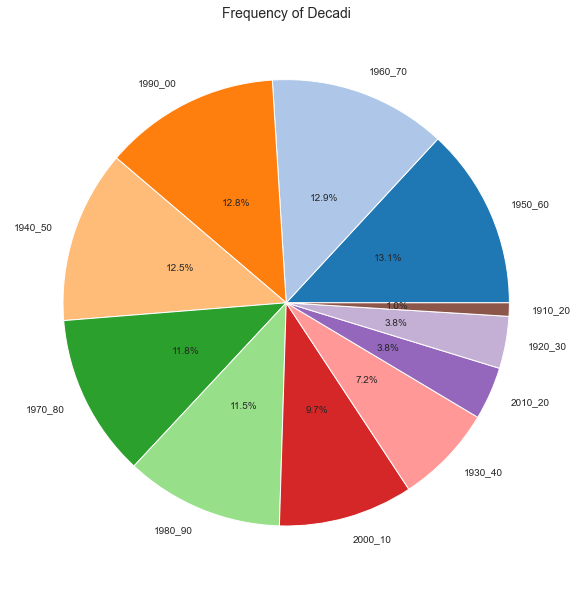

In [28]:
from matplotlib import cm
from matplotlib.pyplot import figure

cs = sb.color_palette("tab20")
#cs =["darkgrey","darkred","green","purple","aqua","blue","yellow","sienna","orangered","deeppink","springgreen","violet", "pink","dodgerblue"]

dataset_1st=dataset_1st.assign(decadi=decadi)
#dz = dict(df["Q5"].drop(0).value_counts())
dz=dict(dataset_1st["decadi"].drop(0).value_counts())
sb.set_style("whitegrid")
pie, ax = plt.subplots(figsize=[10,12])
Labels = [k for k in dz.keys()]
Data   = [float(v) for v in dz.values()]
plt.pie(x = Data, labels=Labels, autopct="%.1f%%", pctdistance=0.5, colors=cs);
plt.title("Frequency of Decadi", fontsize=14);

### Analisi variabili fatalities, crew and passengers e ripartizione fatalities


In [29]:
print(np.max(dataset_1st.Fatalities), np.min(dataset_1st.Fatalities), np.mean(dataset_1st.Fatalities),
      np.median(dataset_1st.Fatalities), np.nanmedian(dataset_1st.Fatalities))
print(np.max(dataset_1st["Ground"]), np.max(dataset_1st["Fatalities"]), np.max(dataset_1st["Fatalities Passangers"]),
      np.max(dataset_1st["Fatalities Crew"]))
print(dataset_1st.shape)
dataset_1st = dataset_1st[dataset_1st["Fatalities"].notna()]
dataset_1st = dataset_1st[dataset_1st["Fatalities Crew"].notna()]
dataset_1st = dataset_1st[dataset_1st["Fatalities Passangers"].notna()]
dataset_1st = dataset_1st[dataset_1st["Ground"].notna()]
print(dataset_1st.shape)

583.0 0.0 22.36593251161851 nan 11.0
2750.0 583.0 560.0 46.0
(4957, 23)
(4691, 23)


##### Qui creiamo nuove variabili per fare in modo che fatalities rappresenti la somma delle sue componenti, e che nel caso fatalities sia maggiore di questa somma la differenza venga aggiunga a new_fatalities_crew

In [30]:
new_fatalities = []
new_fatalities_passangers = []
new_ground = []
new_fatalities_crew = []
for position, i in enumerate(dataset_1st["Fatalities"]):
    ##try and except per gestione na presenti nel dataset originali, tenuti per scelta stilistica e non per motivi computazionali
    try:
        total_death = (dataset_1st["Fatalities Crew"].iloc[position] + dataset_1st["Fatalities Passangers"].iloc[position] +
                       dataset_1st["Ground"].iloc[position])
        diff_death = i - total_death
        if i == total_death:
            new_fatalities.append(i)
            new_fatalities_crew.append(dataset_1st["Fatalities Crew"].iloc[position])
            new_fatalities_passangers.append(dataset_1st["Fatalities Passangers"].iloc[position])
            new_ground.append(dataset_1st["Ground"].iloc[position])
        elif i > total_death:
            new_fatalities.append(i)
            new_fatalities_crew.append(dataset_1st["Fatalities Crew"].iloc[position])
            new_fatalities_passangers.append(dataset_1st["Fatalities Passangers"].iloc[position])
            new_ground.append(dataset_1st["Ground"].iloc[position])
        elif i < total_death:
            i = total_death
            new_fatalities.append(i)
            new_fatalities_crew.append(dataset_1st["Fatalities Crew"].iloc[position])
            new_fatalities_passangers.append(dataset_1st["Fatalities Passangers"].iloc[position])
            new_ground.append(dataset_1st["Ground"].iloc[position])
    except:
        new_fatalities.append(i)
        new_fatalities_crew.append(dataset_1st["Fatalities Crew"].iloc[position])
        new_fatalities_passangers.append(dataset_1st["Fatalities Passangers"].iloc[position])
        new_ground.append(dataset_1st["Ground"].iloc[position])
print(len(new_fatalities), "new fatalities")
print(len(new_ground), "new ground")
print(len(new_fatalities_passangers), "new fatalities passangers")
print(len(new_fatalities_crew), "new fatalities crew")

4691 new fatalities
4691 new ground
4691 new fatalities passangers
4691 new fatalities crew


##### Inseriamo le nuove variabili nel dataset

In [31]:
dataset_1st = dataset_1st.assign(new_fatalities=new_fatalities, new_fatalities_crew=new_fatalities_crew, new_fatalities_passangers=new_fatalities_passangers, new_ground=new_ground)
dataset_1st

,Date,Location,Operator,Route,AC Type,Aboard,Aboard Passangers,Aboard Crew,Fatalities,Fatalities Passangers,...,Aeroporto_5,Aeroporto_6,Ultimo_aeroporto,AC_Type_simplified,Year,decadi,new_fatalities,new_fatalities_crew,new_fatalities_passangers,new_ground
0,09/17/1908,"Fort Myer, Virginia",Military - U.S. Army,Demonstration,Wright Flyer III,2.0,1.0,1.0,1.0,1.0,...,Nan,Nan,Demonstration,WRIGHT FLYER III,1908,1910_20,1.0,0.0,1.0,0.0
2,07/12/1912,"Atlantic City, New Jersey",Military - U.S. Navy,Test flight,Dirigible,5.0,0.0,5.0,5.0,0.0,...,Nan,Nan,Test flight,Dirigible,1912,1910_20,5.0,5.0,0.0,0.0
3,08/06/1913,"Victoria, British Columbia, Canada",Private,NaN,Curtiss seaplane,1.0,0.0,1.0,1.0,0.0,...,Nan,Nan,Sconosciuto,CURTISS SEAPLANE,1913,1910_20,1.0,1.0,0.0,0.0
10,10/01/1916,"Potters Bar, England",Military - German Navy,NaN,Zeppelin L-31 (airship),19.0,0.0,19.0,19.0,0.0,...,Nan,Nan,Informazione riservata,ZEPPELIN,1916,1910_20,19.0,19.0,0.0,0.0
23,12/16/1918,"Elizabeth, New Jersey",US Aerial Mail Service,NaN,De Havilland DH-4,1.0,0.0,1.0,1.0,0.0,...,Nan,Nan,Sconosciuto,DE HAVILLAND,1918,1910_20,1.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4962,04/16/2019,"Puerto Montt, Chile",Archipelagos Service Aereos,Puerto Montt - Ayacara,Pilatus-Britten Norman BN-2B-27 Islander,6.0,5.0,1.0,6.0,5.0,...,Nan,Nan,Ayacara,PILATUS-BRITTEN NORMAN,2019,2010_20,6.0,1.0,5.0,0.0
4963,05/05/2019,"Near Monclava, Mexico",TVPX Aircraft Solutions,Las Vegas - Monterrey,Canadair CL-600-2B16-Challenger,13.0,11.0,2.0,13.0,11.0,...,Nan,Nan,Monterrey,CANADAIR,2019,2010_20,13.0,2.0,11.0,0.0
4964,05/05/2019,"Moscow, Russia",Aeroflot Russian International Airlines,Moscow - Murmansk,Sukhoi Superjet-100-95B,78.0,73.0,5.0,41.0,40.0,...,Nan,Nan,Murmansk,SUKHOI SUPERJET-,2019,2010_20,41.0,1.0,40.0,0.0
4965,06/03/2019,"Near Lipo, India",Military - Indian Air Force,Jorhat-Rowriah - Mechuka,Antonov An-32,13.0,5.0,8.0,13.0,5.0,...,Nan,Nan,Mechuka,ANTONOV AN-32,2019,2010_20,13.0,8.0,5.0,0.0


###### Lo stesso passaggio precedente viene eseguito anche su Aboard con ripartizione su Aboard Crew

In [32]:
print(dataset_1st.shape)
dataset_1st = dataset_1st[dataset_1st["Aboard"].notna()]
dataset_1st = dataset_1st[dataset_1st["Aboard Passangers"].notna()]
dataset_1st = dataset_1st[dataset_1st["Aboard Crew"].notna()]
print(dataset_1st.shape)

(4691, 27)
(4687, 27)


In [33]:
new_aboard = []
new_aboard_passangers = []
new_aboard_crew = []
for position, i in enumerate(dataset_1st.Aboard):
    try:
        total_ab = (dataset_1st["Aboard Passangers"].iloc[position] + dataset_1st["Aboard Crew"].iloc[position])
        diff_ab= dataset_1st["Aboard"].iloc[position]-total_ab
        if i == total_ab:
            new_aboard.append(i)
            new_aboard_crew.append(dataset_1st["Aboard Crew"].iloc[position])
            new_aboard_passangers.append(dataset_1st["Aboard Passangers"].iloc[position])
        elif i > total_ab:
            new_aboard.append(i)
            a=(dataset_1st["Aboard Crew"].iloc[position]+diff_ab)
            new_aboard_crew.append(a)
            new_aboard_passangers.append(dataset_1st["Aboard Passangers"].iloc[position])
        elif i < total_ab:
            i=total_ab
            new_aboard.append(i)
            new_aboard_crew.append(dataset_1st["Aboard Crew"].iloc[position])
            new_aboard_passangers.append(dataset_1st["Aboard Passangers"].iloc[position])
    except:
        print("mannaggia")

In [34]:
dataset_1st.shape
dataset_1st = dataset_1st.assign(new_aboard=new_aboard, new_aboard_crew=new_aboard_crew, new_aboard_passangers=new_aboard_passangers)
dataset_1st

,Date,Location,Operator,Route,AC Type,Aboard,Aboard Passangers,Aboard Crew,Fatalities,Fatalities Passangers,...,AC_Type_simplified,Year,decadi,new_fatalities,new_fatalities_crew,new_fatalities_passangers,new_ground,new_aboard,new_aboard_crew,new_aboard_passangers
0,09/17/1908,"Fort Myer, Virginia",Military - U.S. Army,Demonstration,Wright Flyer III,2.0,1.0,1.0,1.0,1.0,...,WRIGHT FLYER III,1908,1910_20,1.0,0.0,1.0,0.0,2.0,1.0,1.0
2,07/12/1912,"Atlantic City, New Jersey",Military - U.S. Navy,Test flight,Dirigible,5.0,0.0,5.0,5.0,0.0,...,Dirigible,1912,1910_20,5.0,5.0,0.0,0.0,5.0,5.0,0.0
3,08/06/1913,"Victoria, British Columbia, Canada",Private,NaN,Curtiss seaplane,1.0,0.0,1.0,1.0,0.0,...,CURTISS SEAPLANE,1913,1910_20,1.0,1.0,0.0,0.0,1.0,1.0,0.0
10,10/01/1916,"Potters Bar, England",Military - German Navy,NaN,Zeppelin L-31 (airship),19.0,0.0,19.0,19.0,0.0,...,ZEPPELIN,1916,1910_20,19.0,19.0,0.0,0.0,19.0,19.0,0.0
23,12/16/1918,"Elizabeth, New Jersey",US Aerial Mail Service,NaN,De Havilland DH-4,1.0,0.0,1.0,1.0,0.0,...,DE HAVILLAND,1918,1910_20,1.0,1.0,0.0,0.0,1.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4962,04/16/2019,"Puerto Montt, Chile",Archipelagos Service Aereos,Puerto Montt - Ayacara,Pilatus-Britten Norman BN-2B-27 Islander,6.0,5.0,1.0,6.0,5.0,...,PILATUS-BRITTEN NORMAN,2019,2010_20,6.0,1.0,5.0,0.0,6.0,1.0,5.0
4963,05/05/2019,"Near Monclava, Mexico",TVPX Aircraft Solutions,Las Vegas - Monterrey,Canadair CL-600-2B16-Challenger,13.0,11.0,2.0,13.0,11.0,...,CANADAIR,2019,2010_20,13.0,2.0,11.0,0.0,13.0,2.0,11.0
4964,05/05/2019,"Moscow, Russia",Aeroflot Russian International Airlines,Moscow - Murmansk,Sukhoi Superjet-100-95B,78.0,73.0,5.0,41.0,40.0,...,SUKHOI SUPERJET-,2019,2010_20,41.0,1.0,40.0,0.0,78.0,5.0,73.0
4965,06/03/2019,"Near Lipo, India",Military - Indian Air Force,Jorhat-Rowriah - Mechuka,Antonov An-32,13.0,5.0,8.0,13.0,5.0,...,ANTONOV AN-32,2019,2010_20,13.0,8.0,5.0,0.0,13.0,8.0,5.0


### Location Variable -> estraiamo dal testo solo gli stati
#### regex per prendere solo quello dopo l'ultima virgola

In [35]:
new_location = []
for w in dataset_1st.Location:
    new_location.append(re.findall("[^ ,]\w*$", str(w)))

print(new_location)

[['Virginia'], ['Jersey'], ['Canada'], ['England'], ['Jersey'], ['Ohio'], ['Pennsylvania'], ['Italy'], ['England'], ['Maryland'], ['Kent'], ['Jersey'], ['UK'], ['Indiana'], ['Jersey'], ['Jersey'], ['Jersey'], ['Iowa'], ['Ohio'], ['Columbia'], ['England'], ['Maryland'], ['Jersey'], ['Pennsylvania'], ['France'], ['Spain'], ['Illinois'], ['Wyoming'], ['England'], ['Spain'], ['Minnisota'], ['Wisconsin'], ['Gibraltar'], ['Nevada'], ['Australia'], ['NY'], ['Ohio'], ['Wyoming'], ['England'], ['France'], ['Australia'], ['France'], ['Ocean'], ['France'], ['England'], ['France'], ['Spain'], ['Indiana'], ['Italy'], ['Morocco'], ['Morocco'], ['France'], ['Spain'], ['Wyoming'], ['Pennsylvania'], ['France'], ['Kingdom'], ['Romania'], ['Ohio'], ['England'], ['Russia'], ['Ohio'], ['WY'], ['Pennsylvania'], ['Channel'], ['Colombia'], ['States'], ['France'], ['Indiana'], ['England'], ['USSR'], ['Spain'], ['France'], ['Spain'], ['Spain'], ['Hungary'], ['Ohio'], ['Mauritania'], ['Ohio'], ['Germany'], ['Cha

#### Dal momento in cui le stringhe sono dentro una lista, tramite un ciclo annidato andiamo ad estrarre le stringhe e successivamente mettiamo tutto dentro una lista di supporto

In [36]:
tmp_state = []
for i in new_location:
    for w in i:
        tmp_state.append(w)

print(tmp_state)

['Virginia', 'Jersey', 'Canada', 'England', 'Jersey', 'Ohio', 'Pennsylvania', 'Italy', 'England', 'Maryland', 'Kent', 'Jersey', 'UK', 'Indiana', 'Jersey', 'Jersey', 'Jersey', 'Iowa', 'Ohio', 'Columbia', 'England', 'Maryland', 'Jersey', 'Pennsylvania', 'France', 'Spain', 'Illinois', 'Wyoming', 'England', 'Spain', 'Minnisota', 'Wisconsin', 'Gibraltar', 'Nevada', 'Australia', 'NY', 'Ohio', 'Wyoming', 'England', 'France', 'Australia', 'France', 'Ocean', 'France', 'England', 'France', 'Spain', 'Indiana', 'Italy', 'Morocco', 'Morocco', 'France', 'Spain', 'Wyoming', 'Pennsylvania', 'France', 'Kingdom', 'Romania', 'Ohio', 'England', 'Russia', 'Ohio', 'WY', 'Pennsylvania', 'Channel', 'Colombia', 'States', 'France', 'Indiana', 'England', 'USSR', 'Spain', 'France', 'Spain', 'Spain', 'Hungary', 'Ohio', 'Mauritania', 'Ohio', 'Germany', 'Channel', 'Czechoslovakia', 'Belgium', 'Germany', 'England', 'Kingdom', 'Germany', 'Channel', 'Morocco', 'Oregon', 'France', 'Morocco', 'Australia', 'Idaho', 'Germa

#### Puliamo i valori

In [37]:
tmp_state_cleaned = []
for i in tmp_state:
    tmp_state_cleaned.append(re.sub(rf"[^\w\s]", "", i))

print(tmp_state_cleaned)

['Virginia', 'Jersey', 'Canada', 'England', 'Jersey', 'Ohio', 'Pennsylvania', 'Italy', 'England', 'Maryland', 'Kent', 'Jersey', 'UK', 'Indiana', 'Jersey', 'Jersey', 'Jersey', 'Iowa', 'Ohio', 'Columbia', 'England', 'Maryland', 'Jersey', 'Pennsylvania', 'France', 'Spain', 'Illinois', 'Wyoming', 'England', 'Spain', 'Minnisota', 'Wisconsin', 'Gibraltar', 'Nevada', 'Australia', 'NY', 'Ohio', 'Wyoming', 'England', 'France', 'Australia', 'France', 'Ocean', 'France', 'England', 'France', 'Spain', 'Indiana', 'Italy', 'Morocco', 'Morocco', 'France', 'Spain', 'Wyoming', 'Pennsylvania', 'France', 'Kingdom', 'Romania', 'Ohio', 'England', 'Russia', 'Ohio', 'WY', 'Pennsylvania', 'Channel', 'Colombia', 'States', 'France', 'Indiana', 'England', 'USSR', 'Spain', 'France', 'Spain', 'Spain', 'Hungary', 'Ohio', 'Mauritania', 'Ohio', 'Germany', 'Channel', 'Czechoslovakia', 'Belgium', 'Germany', 'England', 'Kingdom', 'Germany', 'Channel', 'Morocco', 'Oregon', 'France', 'Morocco', 'Australia', 'Idaho', 'Germa

#### Infine andiamo a creare una nuovo variabile a ad inserirla all'interno del dataset

In [38]:
dataset_1st = dataset_1st.assign(state_location=tmp_state_cleaned)
print(dataset_1st.state_location)

0       Virginia
2         Jersey
3         Canada
10       England
23        Jersey
          ...   
4962       Chile
4963      Mexico
4964      Russia
4965       India
4966       India
Name: state_location, Length: 4687, dtype: object


In [39]:
list_of_states = dataset_1st.state_location.unique()
print(list_of_states)

['Virginia' 'Jersey' 'Canada' 'England' 'Ohio' 'Pennsylvania' 'Italy'
 'Maryland' 'Kent' 'UK' 'Indiana' 'Iowa' 'Columbia' 'France' 'Spain'
 'Illinois' 'Wyoming' 'Minnisota' 'Wisconsin' 'Gibraltar' 'Nevada'
 'Australia' 'NY' 'Ocean' 'Morocco' 'Kingdom' 'Romania' 'Russia' 'WY'
 'Channel' 'Colombia' 'States' 'USSR' 'Hungary' 'Mauritania' 'Germany'
 'Czechoslovakia' 'Belgium' 'Oregon' 'Idaho' 'Algeria' 'Connecticut'
 'Finland' 'York' 'Uruguay' 'Ariège' 'Nebraska' 'Brazil' 'Minnesota'
 'Kansas' 'Netherlands' 'Texas' 'Washington' 'Tennessee' 'Greece'
 'California' 'Mexico' 'Algiers' 'Cuba' 'Iran' 'Ontario' 'Sardinia'
 'Madagascar' 'Missouri' 'Argentina' 'Massachusetts' 'Denmark' 'China'
 'Zealand' 'Burma' 'Bulgaria' 'Africa' 'Utah' 'Thailand' 'Ilinois'
 'Florida' 'Michigan' 'Iraq' 'Chile' 'Lebanon' 'Bolivia' 'Arkansas'
 'Colorado' 'Georgia' 'Sea' 'Yugoslavia' 'Peru' 'Montana' 'Syria' 'nan'
 'Pakistan' 'Egypt' 'Mississippi' 'Switzerland' 'Alaska' 'Panama' 'Poland'
 'Boliva' 'Trinidad' 'Sweden

#### Notiamo la presenza di un nan value e campi vuoti non visti in precedenza

In [40]:
count_nan = 0
count_vuoti = 0
for i in dataset_1st.state_location:
    if i == 'nan':
        count_nan += 1
    elif i == '':
        count_vuoti += 1

print('counter nan: ', count_nan)
print('counter spazi vuoti: ', count_vuoti)

counter nan:  4
counter spazi vuoti:  14


#### Li andiamo ad eliminare

In [41]:
dataset_1st = dataset_1st[dataset_1st.state_location != 'nan']
dataset_1st = dataset_1st[dataset_1st.state_location != '']
print(dataset_1st)

            Date                            Location  \
0     09/17/1908                 Fort Myer, Virginia   
2     07/12/1912           Atlantic City, New Jersey   
3     08/06/1913  Victoria, British Columbia, Canada   
10    10/01/1916                Potters Bar, England   
23    12/16/1918               Elizabeth, New Jersey   
...          ...                                 ...   
4962  04/16/2019                 Puerto Montt, Chile   
4963  05/05/2019               Near Monclava, Mexico   
4964  05/05/2019                      Moscow, Russia   
4965  06/03/2019                    Near Lipo, India   
4966  07/30/2019                   Rawalpindi, India   

                                     Operator                      Route  \
0                        Military - U.S. Army              Demonstration   
2                        Military - U.S. Navy                Test flight   
3                                     Private                        NaN   
10                     

#### Check finale

In [42]:
count = 0
for i in dataset_1st.state_location:
    if i == 'nan' or i == '':
        count += 1
print(count)

0


#### Accorpiamo alcuni stati e correggiamo quelli scritti in modo scorretto

##### Stati Uniti

In [43]:
list_of_states_cleaned = dataset_1st.state_location.unique()
print(list_of_states_cleaned)

['Virginia' 'Jersey' 'Canada' 'England' 'Ohio' 'Pennsylvania' 'Italy'
 'Maryland' 'Kent' 'UK' 'Indiana' 'Iowa' 'Columbia' 'France' 'Spain'
 'Illinois' 'Wyoming' 'Minnisota' 'Wisconsin' 'Gibraltar' 'Nevada'
 'Australia' 'NY' 'Ocean' 'Morocco' 'Kingdom' 'Romania' 'Russia' 'WY'
 'Channel' 'Colombia' 'States' 'USSR' 'Hungary' 'Mauritania' 'Germany'
 'Czechoslovakia' 'Belgium' 'Oregon' 'Idaho' 'Algeria' 'Connecticut'
 'Finland' 'York' 'Uruguay' 'Ariège' 'Nebraska' 'Brazil' 'Minnesota'
 'Kansas' 'Netherlands' 'Texas' 'Washington' 'Tennessee' 'Greece'
 'California' 'Mexico' 'Algiers' 'Cuba' 'Iran' 'Ontario' 'Sardinia'
 'Madagascar' 'Missouri' 'Argentina' 'Massachusetts' 'Denmark' 'China'
 'Zealand' 'Burma' 'Bulgaria' 'Africa' 'Utah' 'Thailand' 'Ilinois'
 'Florida' 'Michigan' 'Iraq' 'Chile' 'Lebanon' 'Bolivia' 'Arkansas'
 'Colorado' 'Georgia' 'Sea' 'Yugoslavia' 'Peru' 'Montana' 'Syria'
 'Pakistan' 'Egypt' 'Mississippi' 'Switzerland' 'Alaska' 'Panama' 'Poland'
 'Boliva' 'Trinidad' 'Sweden' 'Nor

In [44]:
USA_states = ['Virginia', 'Jersey', 'Ohio', 'Pennsylvania', 'Illinois', 'Maryland', 'Kent', 'Indiana', 'Iowa',
              'Columbia', 'Wyoming', 'Minnisota', 'Wisconsin', 'Nevada', 'NY', 'WY', 'States', 'York', 'Utah', 'Oregon',
              'Idaho', 'Connecticut', 'Minnesota', 'Kansas', 'Texas', 'Washington', 'Tennessee', 'Greece', 'California',
              'Mexico', 'Missouri', 'Massachusetts', 'Utah', 'Ilinois', 'Florida', 'Michigan', 'Arkansas', 'Colorado',
              'Georgia', 'Montana', 'Mississippi', 'Alaska', 'Cailifornia', 'Indies', 'Andes', 'Guam', 'Tonkin',
              'Carolina', 'Kentucky', 'Maine', 'Alabama', 'Delaware', 'Dekota', 'Hampshire', 'Washingon', 'DC',
              'Tennesee', 'Deleware', 'Louisiana', 'Massachutes', 'Alakska', 'Coloado', 'Vermont', 'Dakota',
              'Calilfornia', 'Alaksa', 'Mississipi', 'Arizona', 'Wisconson', 'Nebraska', 'Oklahoma', 'Airzona', 'HI', 'Hawaii']
states = []
for state in dataset_1st.state_location:
    if state in USA_states:
        states.append('United States')
    else:
        states.append(state)

print(states)

['United States', 'United States', 'Canada', 'England', 'United States', 'United States', 'United States', 'Italy', 'England', 'United States', 'United States', 'United States', 'UK', 'United States', 'United States', 'United States', 'United States', 'United States', 'United States', 'United States', 'England', 'United States', 'United States', 'United States', 'France', 'Spain', 'United States', 'United States', 'England', 'Spain', 'United States', 'United States', 'Gibraltar', 'United States', 'Australia', 'United States', 'United States', 'United States', 'England', 'France', 'Australia', 'France', 'Ocean', 'France', 'England', 'France', 'Spain', 'United States', 'Italy', 'Morocco', 'Morocco', 'France', 'Spain', 'United States', 'United States', 'France', 'Kingdom', 'Romania', 'United States', 'England', 'Russia', 'United States', 'United States', 'United States', 'Channel', 'Colombia', 'United States', 'France', 'United States', 'England', 'USSR', 'Spain', 'France', 'Spain', 'Spai

In [45]:
print(sorted(set(states)))

['AK', 'Afghanistan', 'Afghanstan', 'Africa', 'Airport', 'Airstrip', 'Albania', 'Algeria', 'Algiers', 'Amsterdam', 'Angola', 'Antarctica', 'Antigua', 'Antilles', 'Arabia', 'Aregntina', 'Argenina', 'Argentina', 'Ariège', 'Armenia', 'Atlantic', 'Australia', 'Australila', 'Austria', 'Azerbaijan', 'Azores', 'BO', 'Baangladesh', 'Bahamas', 'Bahrain', 'Bangladesh', 'Barbados', 'Base', 'Belgium', 'Benin', 'Bermuda', 'Bhutan', 'Bimini', 'Boliva', 'Bolivia', 'Borneo', 'Bosnia', 'Botswana', 'Brazil', 'Bulgaria', 'Burma', 'CA', 'Cachoeria', 'Caledonia', 'Cambodia', 'Cameroon', 'Cameroons', 'Canada', 'Canada2', 'Chad', 'Channel', 'Chechnya', 'Chile', 'Chili', 'China', 'Coast', 'Coatia', 'Cogo', 'Colombia', 'Comoros', 'Congo', 'Crete', 'Croatia', 'Cuba', 'Cyprus', 'Czechoslovakia', 'Denmark', 'Djbouti', 'Djibouti', 'Ecuador', 'Egypt', 'Elalat', 'Emirates', 'England', 'Eritrea', 'Estonia', 'Ethiopia', 'Fiji', 'Finland', 'France', 'Gabon', 'Gambia', 'Germany', 'Ghana', 'Gibraltar', 'Greenland', 'Guad

##### Correzioni varie

In [46]:
states2 = []
for state in states:
    states2.append(state.replace('Canada2', 'Canada').
                   replace('CA', 'Canada').
                   replace('UAR', 'Emirates').
                   replace('Emirates', 'Emirates').
                   replace('UAE', 'Emirates').
                   replace('Djbouti', 'Djibouti').
                   replace('Bulgeria', 'Bulgaria').
                   replace('bulgaria', 'Bulgaria').
                   replace('Aregntina', 'Argentina').
                   replace('Amsterdam', 'Belgium').
                   replace('Ontario', 'Canada').
                   replace('Okinawa', 'Japan').
                   replace('karkov', 'Ukraine').
                   replace('Jamacia', 'Jamaica').
                   replace('Argenina', 'Argentina').
                   replace('Airstrip', 'Airport').
                   replace('Algiers', 'Algeria').
                   replace('Russian', 'Russia').
                   replace('Swden', 'Sweden').
                   replace('coast', 'Coast').
                   replace('BO', 'Bolivia').
                   replace('Rico', 'Costa Rica').
                   replace('Rica', 'Costa Rica').
                   replace('Karkinitsky', 'Ukraine').
                   replace('Saskatchewan', 'Canada').
                   replace('Australila', 'Australia').
                   replace('Inodnesia', 'Indonesia').
                   replace('Chili', 'Chile').
                   replace('Korean', 'Korea').
                   replace('Uzbekstan', 'Uzbekistan').
                   replace('Cogo', 'Congo').
                   replace('Zaire', 'Democratic Republic of Congo').
                   replace('Inagua', 'Bahamas').
                   replace('Bimini', 'Bahamas').
                   replace('Philipines', 'Philippines').
                   replace('Marroco', 'Morocco').
                   replace('Yugosalvia', 'Yugoslavia').
                   replace('Ariège', 'France').
                   replace('Arabia', 'Saudi Arabia').
                   replace('Cachoeria', 'Brazil').
                   replace('Kirghizia', 'Kyrgyzstan').
                   replace('Reunion', 'France').
                   replace('Volta', 'Ghana').
                   replace('Manmar', 'Myanmar').
                   replace('Baangladesh', 'Bangladesh').
                   replace('Papua', 'Papua New Guinea').
                   replace('Mauretania', 'Mauritania').
                   replace('Azores', 'Portugal').
                   replace('Antigua', 'Bermuda').
                   replace('Zealand', 'New Zealand').
                   replace('Elalat', 'Saudi Arabia').
                   replace('Sarawak', 'Mali').
                   replace('Phillipines', 'Philippines').
                   replace('Afghanstan', 'Afghanistan').
                   replace('Boliva', 'Bolivia').
                   replace('Napal', 'Nepal').
                   replace('Bosnia', 'Bosnia').
                   replace('Burma', 'Myanmar').
                   replace('Nambia', 'Namibia').
                   replace('Malaya', 'Malaysia').
                   replace('Hati', 'Haiti').
                   replace('Labrador', 'Canada').
                   replace('Coatia', 'Croatia').
                   replace('Province', 'France').
                   replace('Crete', 'Greece').
                   replace('Tanganyika', 'Tanzania').
                   replace('Lanka', 'Sri Lanka').
                   replace('Karkov', 'Ukraine').
                   replace('Kong', 'China').
                   replace('Leone', 'Sierra Leone').
                   replace('Manitoba', 'Canada').
                   replace('Salvador', 'El Salvador').
                   replace('Herzegovina', 'Bosnia').
                   replace('Hunary', 'Hungary').
                   replace('Luqa', 'Malta').
                   replace('Verde', 'Cabo Verde').
                   replace('Surinam', 'Suriname').
                   replace('Indian', 'India').
                   replace('Cameroons', 'Cameroon').
                   replace('Sirte', 'Libya').
                   replace('Kazakistan', 'Kazakhstan').
                   replace('Bugaria', 'Bulgaria').
                   replace('Surinamee', 'Suriname').
                   replace('Mexic', 'Mexico').
                   replace('Tomé', 'Principe').
                   replace('Principe', 'Principe'))

print(sorted(set(states2)))

['AK', 'Afghanistan', 'Africa', 'Airport', 'Albania', 'Algeria', 'Angola', 'Antarctica', 'Antilles', 'Argentina', 'Armenia', 'Atlantic', 'Australia', 'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain', 'Bangladesh', 'Barbados', 'Base', 'Belgium', 'Benin', 'Bermuda', 'Bhutan', 'Bolivia', 'Borneo', 'Bosnia', 'Botswana', 'Brazil', 'Bulgaria', 'Cabo Verde', 'Caledonia', 'Cambodia', 'Cameroon', 'Canada', 'Chad', 'Channel', 'Chechnya', 'Chile', 'China', 'Coast', 'Colombia', 'Comoros', 'Congo', 'Costa Costa Rica', 'Costa Rica', 'Croatia', 'Cuba', 'Cyprus', 'Czechoslovakia', 'Democratic Republic of Congo', 'Denmark', 'Djibouti', 'Ecuador', 'Egypt', 'El Salvador', 'Emirates', 'England', 'Eritrea', 'Estonia', 'Ethiopia', 'Fiji', 'Finland', 'France', 'Gabon', 'Gambia', 'Germany', 'Ghana', 'Gibraltar', 'Greece', 'Greenland', 'Guadeloupe', 'Guatemala', 'Guernsey', 'Guinea', 'Gulf', 'Guyana', 'Haiti', 'Honduras', 'Hungary', 'Iceland', 'India', 'Indonesia', 'Iran', 'Iraq', 'Ireland', 'Island', 'Islands', 

##### Regno Unito

In [47]:
states_UK = ['UK', 'Wales', 'Scotland', 'Eire', 'Union', 'Kingdom', 'England', 'Caledonia', 'Man']
states3 = []
for state in states2:
    if state in states_UK:
        states3.append('United Kingdom')
    else:
        states3.append(state)

print(set(states3))

{'Morocco', 'Republic', 'Nag', 'Borneo', 'New Zealand', 'Gibraltar', 'Guyana', 'Libya', 'Nigeria', 'Mozambique', 'Albania', 'Yugoslavia', 'Uganda', 'Armenia', 'Tasmania', 'Thailand', 'Kyrgyzstan', 'Bulgaria', 'Polynesia', 'Sierra Leone', 'Namibia', 'Guatemala', 'Peru', 'El Salvador', 'China', 'Sri Lanka', 'Mauritania', 'India', 'AK', 'Kosovo', 'Channel', 'Coast', 'Oman', 'Honduras', 'Greece', 'Comoros', 'Syria', 'Islands', 'Qatar', 'Jordan', 'Belgium', 'Latvia', 'Croatia', 'Mali', 'Korea', 'Yemen', 'Bahrain', 'Russia', 'Austria', 'Algeria', 'Colombia', 'Botswana', 'Paraguay', 'Emirates', 'Guernsey', 'Iran', 'Chile', 'Norway', 'Ocean', 'Ecuador', 'Malaysia', 'Chad', 'Germany', 'Saudi Arabia', 'Cabo Verde', 'Ethiopia', 'Bahamas', 'Costa Costa Rica', 'Micronesia', 'USSR', 'Cambodia', 'Australia', 'Spain', 'Denmark', 'Bolivia', 'Turkmenistan', 'Democratic Republic of Congo', 'Papua New Guinea', 'Guadeloupe', 'Cyprus', 'Sardinia', 'Bangladesh', 'Egypt', 'Station', 'Fiji', 'Costa Rica', 'Gam

#### Infine andiamo ad inserire la variabile nel dataset

In [48]:
dataset_1st = dataset_1st.assign(States=states3)

#### Eliminiamo altre due osservazioni che non siamo riusciti a classificare

In [49]:
dataset_1st = dataset_1st[dataset_1st.States != 'AK']
dataset_1st = dataset_1st[dataset_1st.States != 'Nag']
dataset_1st.States

0        United States
2        United States
3               Canada
10      United Kingdom
23       United States
             ...      
4962             Chile
4963     United States
4964            Russia
4965             India
4966             India
Name: States, Length: 4667, dtype: object

### Seb_Regioni

#### Importiamo un dataset di supporto tramite il quale andremo a fare un match tra i paesi e i territori

In [50]:
continents_dataset = pd.read_csv("datasets/continents2.csv")

In [51]:
continents_dataset

,name,alpha-2,alpha-3,country-code,iso_3166-2,region,sub-region,intermediate-region,region-code,sub-region-code,intermediate-region-code
0,Afghanistan,AF,AFG,4,ISO 3166-2:AF,Asia,Southern Asia,NaN,142.0,34.0,NaN
1,Åland Islands,AX,ALA,248,ISO 3166-2:AX,Europe,Northern Europe,NaN,150.0,154.0,NaN
2,Albania,AL,ALB,8,ISO 3166-2:AL,Europe,Southern Europe,NaN,150.0,39.0,NaN
3,Algeria,DZ,DZA,12,ISO 3166-2:DZ,Africa,Northern Africa,NaN,2.0,15.0,NaN
4,American Samoa,AS,ASM,16,ISO 3166-2:AS,Oceania,Polynesia,NaN,9.0,61.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...
244,Wallis and Futuna,WF,WLF,876,ISO 3166-2:WF,Oceania,Polynesia,NaN,9.0,61.0,NaN
245,Western Sahara,EH,ESH,732,ISO 3166-2:EH,Africa,Northern Africa,NaN,2.0,15.0,NaN
246,Yemen,YE,YEM,887,ISO 3166-2:YE,Asia,Western Asia,NaN,142.0,145.0,NaN
247,Zambia,ZM,ZMB,894,ISO 3166-2:ZM,Africa,Sub-Saharan Africa,Eastern Africa,2.0,202.0,14.0


In [52]:
macro_aree = continents_dataset['sub-region'].unique()
print(macro_aree)

['Southern Asia' 'Northern Europe' 'Southern Europe' 'Northern Africa'
 'Polynesia' 'Sub-Saharan Africa' 'Latin America and the Caribbean' nan
 'Western Asia' 'Australia and New Zealand' 'Western Europe'
 'Eastern Europe' 'Northern America' 'South-eastern Asia' 'Eastern Asia'
 'Melanesia' 'Micronesia' 'Central Asia']


#### Creiamo la lista dei paesi per ciascuna seb_regione

In [53]:
Southern_Asia = continents_dataset['name']._where(continents_dataset['sub-region'] == 'Southern Asia').unique()

Northern_Europe = continents_dataset['name']._where(continents_dataset['sub-region'] == 'Northern Europe').unique()

Southern_Europe = continents_dataset['name']._where(continents_dataset['sub-region'] == 'Southern Europe').unique()

Northern_Africa = continents_dataset['name']._where(continents_dataset['sub-region'] == 'Northern Africa').unique()

Polynesia = continents_dataset['name']._where(continents_dataset['sub-region'] == 'Polynesia').unique()

Sub_Saharan_Africa = continents_dataset['name']._where(continents_dataset['sub-region'] == 'Sub-Saharan Africa').unique()

Latin_America = continents_dataset['name']._where(continents_dataset['sub-region'] == 'Latin America and the Caribbean').unique()

Western_Asia = continents_dataset['name']._where(continents_dataset['sub-region'] == 'Western Asia').unique()

Australia_and_Zealand = continents_dataset['name']._where(continents_dataset['sub-region'] == 'Australia and New Zealand').unique()

Western_Europe = continents_dataset['name']._where(continents_dataset['sub-region'] == 'Western Europe').unique()

Eastern_Europe = continents_dataset['name']._where(continents_dataset['sub-region'] == 'Eastern Europe').unique()

Northern_America = continents_dataset['name']._where(continents_dataset['sub-region'] == 'Northern America').unique()

South_Eastern_Asia = continents_dataset['name']._where(continents_dataset['sub-region'] == 'South-eastern Asia').unique()

Eastern_Asia = continents_dataset['name']._where(continents_dataset['sub-region'] == 'Eastern Asia').unique()

Melanesia = continents_dataset['name']._where(continents_dataset['sub-region'] == 'Melanesia').unique()

Micronesia = continents_dataset['name']._where(continents_dataset['sub-region'] == 'Micronesia').unique()

Central_Asia = continents_dataset['name']._where(continents_dataset['sub-region'] == 'Central Asia').unique()


#print(Southern_Europe)

#### Facciamo un match per ogni sub_regione tra gli stati del dataset e quelli del dataset di supporto

In [54]:
sub_regions = []
for nation in dataset_1st.States:
    if nation in Southern_Asia:
        sub_regions.append('Southern Asia')
    elif nation in Northern_Europe:
        sub_regions.append('Northern Europe')
    elif nation in Southern_Europe:
        sub_regions.append('Southern Europe')
    elif nation in Northern_Africa:
        sub_regions.append('Northern Africa')
    elif nation in Polynesia:
        sub_regions.append('Polynesia')
    elif nation in Sub_Saharan_Africa:
        sub_regions.append('Sub-Saharan Africa')
    elif nation in Latin_America:
        sub_regions.append('Latin America and the Caribbean')
    elif nation in Western_Asia:
        sub_regions.append('Western Asia')
    elif nation in Australia_and_Zealand:
        sub_regions.append('Australia and New Zealand')
    elif nation in Western_Europe:
        sub_regions.append('Western Europe')
    elif nation in Eastern_Europe:
        sub_regions.append('Eastern Europe')
    elif nation in Northern_America:
        sub_regions.append('Northern America')
    elif nation in South_Eastern_Asia:
        sub_regions.append('South-eastern Asia')
    elif nation in Eastern_Asia:
        sub_regions.append('Eastern Asia')
    elif nation in Melanesia:
        sub_regions.append('Melanesia')
    elif nation in Micronesia:
        sub_regions.append('Micronesia')
    elif nation in Central_Asia:
        sub_regions.append('Central Asia')
    else: sub_regions.append(nation)

print(sorted(set(sub_regions)))

['Africa', 'Airport', 'Antarctica', 'Antilles', 'Atlantic', 'Australia and New Zealand', 'Base', 'Borneo', 'Bosnia', 'Central Asia', 'Channel', 'Chechnya', 'Coast', 'Costa Costa Rica', 'Czechoslovakia', 'Democratic Republic of Congo', 'Eastern Asia', 'Eastern Europe', 'Emirates', 'Gulf', 'Island', 'Islands', 'Korea', 'Kosovo', 'Latin America and the Caribbean', 'Melanesia', 'Micronesia', 'Morroco', 'Newfoundland', 'Northern Africa', 'Northern America', 'Northern Europe', 'Ocean', 'Polynesia', 'Republic', 'Rhodesia', 'Sardinia', 'Sea', 'Somaliland', 'Sound', 'South-eastern Asia', 'Southern Asia', 'Southern Europe', 'Station', 'Sub-Saharan Africa', 'Tahiti', 'Tasmania', 'Territory', 'Timor', 'Trinidad', 'USSR', 'Western Asia', 'Western Europe', 'Yugoslavia']


#### Classifichiamo manualmente alcuni paesi che sono rimasti fuori dal match

In [55]:
sub_regions2 = []
for sub in sub_regions:
    sub_regions2.append(sub.replace('Timor', 'South-eastern Asia').
                        replace('Sardinia', 'Southern Europe').
                        replace('Chechnya', 'Western Asia').
                        replace('Trinidad', 'Latin America and the Caribbean').
                        replace('Bosnia and Herzegovina', 'Canada').
                        replace('Borneo', 'South-eastern Asia').
                        replace('Somaliland', 'Sub-Saharan Africa').
                        replace('Brunei', 'South-eastern Asia').
                        replace('Czechoslovakia', 'Eastern Europe').
                        replace('Yugoslavia', 'Southern Europe').
                        replace('Himalayas', 'Southern Asia').
                        replace('Tasmania', 'Sub-Saharan Africa').
                        replace('Tahiti', 'Australia and New Zealand').
                        replace('Rhodesia', 'Sub-Saharan Africa').
                        replace('Kosovo', 'Southern Europe').
                        replace('Korea', 'Eastern Asia').
                        replace('Costa Costa Rica', 'Latin America and the Caribbean').
                        replace('Bosnia', 'Southern Europe').
                        replace('Principe', 'Sub-Saharan Africa').
                        replace('Emirates', 'Western Asia').
                        replace('Morroco', 'Northern Africa').
                        replace('Democratic Republic of Congo', 'Sub-Saharan Africa').
                        replace('Antilles', 'Latin America and the Caribbean').
                        replace('USSR', 'Eastern Europe'))

print(sorted(set(sub_regions2)))

['Africa', 'Airport', 'Antarctica', 'Atlantic', 'Australia and New Zealand', 'Base', 'Central Asia', 'Channel', 'Coast', 'Eastern Asia', 'Eastern Europe', 'Gulf', 'Island', 'Islands', 'Latin America and the Caribbean', 'Melanesia', 'Micronesia', 'Newfoundland', 'Northern Africa', 'Northern America', 'Northern Europe', 'Ocean', 'Polynesia', 'Republic', 'Sea', 'Sound', 'South-eastern Asia', 'Southern Asia', 'Southern Europe', 'Station', 'Sub-Saharan Africa', 'Territory', 'Western Asia', 'Western Europe']


#### Creiamo la nuova colonna con le sub_regioni

In [56]:
dataset_1st = dataset_1st.assign(Sub_Regions=sub_regions2)

In [57]:
dataset_1st.Sub_Regions

0                      Northern America
2                      Northern America
3                      Northern America
10                      Northern Europe
23                     Northern America
                     ...               
4962    Latin America and the Caribbean
4963                   Northern America
4964                     Eastern Europe
4965                      Southern Asia
4966                      Southern Asia
Name: Sub_Regions, Length: 4667, dtype: object

#### Infine controlliamo le ultime osservazioni che non sono utili ai fini dell'analisi

In [58]:
count_Africa = 0
count_Base = 0
count_channel = 0
count_newfoundland = 0
count_Ocean = 0
count_Sea = 0
count_sound = 0
count_station = 0
count_Territory = 0
count_island = 0
count_islands = 0
count_airport = 0
count_coast = 0
count_gulf = 0
count_republic = 0
count_USSR = 0

for i in sub_regions2:
    if i == 'Africa':
        count_Africa+=1
    elif i == 'Base':
        count_Base+=1
    elif i == 'Channel':
        count_channel+=1
    elif i == 'Newfoundland':
        count_newfoundland+=1
    elif i == 'Ocean':
        count_Ocean+=1
    elif i == 'Sea':
        count_Sea+=1
    elif i == 'Sound':
        count_sound+=1
    elif i == 'Station':
        count_station+=1
    elif i == 'Territory':
        count_Territory+=1
    elif i == 'Island':
        count_island+=1
    elif i == 'Islands':
        count_islands+=1
    elif i == 'Airport':
        count_airport+=1
    elif i == 'Coast':
        count_coast+=1
    elif i == 'Gulf':
        count_gulf+=1
    elif i == 'Republic':
        count_republic+=1
    elif i == 'USSR':
        count_USSR+=1


print(
    count_Africa,
    count_Base,
    count_channel,
    count_newfoundland,
    count_Ocean,
    count_Sea,
    count_sound,
    count_station,
    count_Territory,
    count_island,
    count_islands,
    count_airport,
    count_coast,
    count_gulf,
    count_republic,
    count_USSR
)
# Totale: 175
#da eliminare sicuro: Territory, Station, Sound, Base, Channel, Newfoundland, gulf, airport, coast,
# Valutare anche le altre, io eliminerei tutto tranne 'Africa' perché 1) 175 non sono troppe, 2) sono generiche e non è possibile avere una localizzazione geografica.

27 1 7 8 35 16 1 1 1 8 26 3 10 2 15 0


#### E alcune decidiamo di eliminarle (tutte tranne 'Africa')

In [59]:
dataset_1st = dataset_1st[dataset_1st.Sub_Regions != 'Territory']
dataset_1st = dataset_1st[dataset_1st.Sub_Regions != 'Station']
dataset_1st = dataset_1st[dataset_1st.Sub_Regions != 'Sound']
dataset_1st = dataset_1st[dataset_1st.Sub_Regions != 'Base']
dataset_1st = dataset_1st[dataset_1st.Sub_Regions != 'Channel']
dataset_1st = dataset_1st[dataset_1st.Sub_Regions != 'Newfoundland']
dataset_1st = dataset_1st[dataset_1st.Sub_Regions != 'Ocean']
dataset_1st = dataset_1st[dataset_1st.Sub_Regions != 'Island']
dataset_1st = dataset_1st[dataset_1st.Sub_Regions != 'Islands']
dataset_1st = dataset_1st[dataset_1st.Sub_Regions != 'Airport']
dataset_1st = dataset_1st[dataset_1st.Sub_Regions != 'Coast']
dataset_1st = dataset_1st[dataset_1st.Sub_Regions != 'Gulf']
dataset_1st = dataset_1st[dataset_1st.Sub_Regions != 'Republic']
dataset_1st = dataset_1st[dataset_1st.Sub_Regions != 'Sea']

In [60]:
dataset_1st.Sub_Regions

0                      Northern America
2                      Northern America
3                      Northern America
10                      Northern Europe
23                     Northern America
                     ...               
4962    Latin America and the Caribbean
4963                   Northern America
4964                     Eastern Europe
4965                      Southern Asia
4966                      Southern Asia
Name: Sub_Regions, Length: 4533, dtype: object

#### Adesso andiamo a creare un'altra variabile che racchiude le sub_regioni nei continenti

In [61]:
dataset_1st.Sub_Regions.unique()

array(['Northern America', 'Northern Europe', 'Southern Europe',
       'Western Europe', 'Australia and New Zealand', 'Northern Africa',
       'Eastern Europe', 'Latin America and the Caribbean',
       'Sub-Saharan Africa', 'Southern Asia', 'Eastern Asia',
       'South-eastern Asia', 'Africa', 'Western Asia', 'Central Asia',
       'Polynesia', 'Atlantic', 'Melanesia', 'Antarctica', 'Micronesia'],
      dtype=object)

In [62]:
continents_dataset.region.unique()

array(['Asia', 'Europe', 'Africa', 'Oceania', 'Americas', nan],
      dtype=object)

#### Creiamo una variabile per ogni continente utilizzando il dataset di supporto

In [63]:
Asia = continents_dataset['sub-region']._where(continents_dataset['region'] == 'Asia').unique()

Europe = continents_dataset['sub-region']._where(continents_dataset['region'] == 'Europe').unique()

Africa = continents_dataset['sub-region']._where(continents_dataset['region'] == 'Africa').unique()

America = continents_dataset['sub-region']._where(continents_dataset['region'] == 'Americas').unique()

Oceania = continents_dataset['sub-region']._where(continents_dataset['region'] == 'Oceania').unique()

print(Africa)

[nan 'Northern Africa' 'Sub-Saharan Africa']


#### Andiamo a fare il matching tra le Sub_Regioni precedentemente definite

In [64]:
Continents = []
for sub_region in dataset_1st.Sub_Regions:
    if sub_region in Asia:
        Continents.append('Asia')
    elif sub_region in Europe:
        Continents.append('Europe')
    elif sub_region in Africa:
        Continents.append('Africa')
    elif sub_region in America:
        Continents.append('America')
    elif sub_region in Oceania:
        Continents.append('Oceania')
    elif type(sub_region) == float:
        Continents.append('America')
    else: Continents.append(sub_region)

print(sorted(set(Continents)))

['Africa', 'America', 'Antarctica', 'Asia', 'Atlantic', 'Europe', 'Oceania']


In [65]:
a=0
b=0
for i in Continents:
    if i == "Antarctica":
        a+=1
    elif i == "Atlantic":
        b+=1

print(a,b)
#        Continents.append(i)
print(len(Continents))

1 2
4533


In [66]:
print(set(Continents))

{'Asia', 'Africa', 'Oceania', 'Antarctica', 'America', 'Europe', 'Atlantic'}


#### Creiamo la nuova variabile e la andiamo ad aggiungere al dataset

In [67]:
dataset_1st = dataset_1st.assign(Continent=Continents)

In [68]:
dataset_1st = dataset_1st._where(dataset_1st.Continent != "Atlantic")
dataset_1st = dataset_1st._where(dataset_1st.Continent != "Antarctica")
dataset_1st = dataset_1st._where(dataset_1st.Continent != "NaN")


In [69]:
dataset_1st.Continent.unique()

array(['America', 'Europe', 'Oceania', 'Africa', 'Asia', nan],
      dtype=object)

## Estrazione città da Aeroporto di partenza


In [70]:
dataset_1st

,Date,Location,Operator,Route,AC Type,Aboard,Aboard Passangers,Aboard Crew,Fatalities,Fatalities Passangers,...,new_fatalities_crew,new_fatalities_passangers,new_ground,new_aboard,new_aboard_crew,new_aboard_passangers,state_location,States,Sub_Regions,Continent
0,09/17/1908,"Fort Myer, Virginia",Military - U.S. Army,Demonstration,Wright Flyer III,2.0,1.0,1.0,1.0,1.0,...,0.0,1.0,0.0,2.0,1.0,1.0,Virginia,United States,Northern America,America
2,07/12/1912,"Atlantic City, New Jersey",Military - U.S. Navy,Test flight,Dirigible,5.0,0.0,5.0,5.0,0.0,...,5.0,0.0,0.0,5.0,5.0,0.0,Jersey,United States,Northern America,America
3,08/06/1913,"Victoria, British Columbia, Canada",Private,NaN,Curtiss seaplane,1.0,0.0,1.0,1.0,0.0,...,1.0,0.0,0.0,1.0,1.0,0.0,Canada,Canada,Northern America,America
10,10/01/1916,"Potters Bar, England",Military - German Navy,NaN,Zeppelin L-31 (airship),19.0,0.0,19.0,19.0,0.0,...,19.0,0.0,0.0,19.0,19.0,0.0,England,United Kingdom,Northern Europe,Europe
23,12/16/1918,"Elizabeth, New Jersey",US Aerial Mail Service,NaN,De Havilland DH-4,1.0,0.0,1.0,1.0,0.0,...,1.0,0.0,0.0,1.0,1.0,0.0,Jersey,United States,Northern America,America
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4962,04/16/2019,"Puerto Montt, Chile",Archipelagos Service Aereos,Puerto Montt - Ayacara,Pilatus-Britten Norman BN-2B-27 Islander,6.0,5.0,1.0,6.0,5.0,...,1.0,5.0,0.0,6.0,1.0,5.0,Chile,Chile,Latin America and the Caribbean,America
4963,05/05/2019,"Near Monclava, Mexico",TVPX Aircraft Solutions,Las Vegas - Monterrey,Canadair CL-600-2B16-Challenger,13.0,11.0,2.0,13.0,11.0,...,2.0,11.0,0.0,13.0,2.0,11.0,Mexico,United States,Northern America,America
4964,05/05/2019,"Moscow, Russia",Aeroflot Russian International Airlines,Moscow - Murmansk,Sukhoi Superjet-100-95B,78.0,73.0,5.0,41.0,40.0,...,1.0,40.0,0.0,78.0,5.0,73.0,Russia,Russia,Eastern Europe,Europe
4965,06/03/2019,"Near Lipo, India",Military - Indian Air Force,Jorhat-Rowriah - Mechuka,Antonov An-32,13.0,5.0,8.0,13.0,5.0,...,8.0,5.0,0.0,13.0,8.0,5.0,India,India,Southern Asia,Asia


In [71]:
dataset_1st.Aeroporto_di_partenza.unique()

array(['Demonstration', 'Test flight', 'Sconosciuto', ..., 'Pohnpei',
       'Georgetown', ' Jorhat-Rowriah'], dtype=object)

In [72]:
aerop_matched = []
aerop_not_matched = []
for aerop in dataset_1st.Aeroporto_di_partenza:
    if aerop in world_cities_dataset.name.unique():
        aerop_matched.append(aerop)
    elif aerop == 'Demonstration':
        aerop_matched.append(aerop)
    elif aerop == 'Test flight':
        aerop_matched.append(aerop)
    elif aerop == 'Sconosciuto':
        aerop_matched.append(aerop)
    elif aerop == 'Informazione riservata':
        aerop_matched.append(aerop)
    elif aerop == 'Military exercise':
        aerop_matched.append(aerop)
    elif aerop == 'Exercises':
        aerop_matched.append(aerop)
    elif aerop == 'Test':
        aerop_matched.append(aerop)
    elif aerop == 'Test Flight':
        aerop_matched.append(aerop)
    elif aerop in cities_dataset.name.unique():
        aerop_matched.append(aerop)
    elif aerop in dataset_1st.States.unique():
        aerop_matched.append(aerop)
    else: aerop_not_matched.append(aerop)

print(f'città matchate: {len(aerop_matched)}')
print(f'città NON matchate: {len(aerop_not_matched)}')

città matchate: 3287
città NON matchate: 1246


In [73]:
print(len(set(aerop_matched)))

995


In [74]:
for i in dataset_1st.Aeroporto_di_partenza:
    if i in aerop_not_matched:
        dataset_1st = dataset_1st[dataset_1st.Aeroporto_di_partenza != i]

#### Aggiunta colonna relativa agli stati degli aeroporti di partenza


In [75]:
a = {}
for i in dataset_1st["Aeroporto_di_partenza"]:
    if i in cities_dataset["name"].values:
        b = str(cities_dataset["country_name"][cities_dataset["name"] == i]).split()[1]
        if i == "Paris":
            a["Paris"] = "France"
        elif i == "Washington":
            a[i] = "United States"
        elif b == "United":
            a[i] = b + " " + str(cities_dataset["country_name"][cities_dataset["name"] == i]).split()[2]
        elif i == "London":
            a[i] = "United Kingdom"
        elif type(i) == float:
            a[i] = 'Sconosciuto'
        else:
            a[i] = b
    else:
        a[i] = i
state_aerop_partenza = [a[state] for state in dataset_1st["Aeroporto_di_partenza"]]

dataset_1st = dataset_1st.assign(State_Aeroporto_di_partenza=state_aerop_partenza)
dataset_1st

,Date,Location,Operator,Route,AC Type,Aboard,Aboard Passangers,Aboard Crew,Fatalities,Fatalities Passangers,...,new_fatalities_passangers,new_ground,new_aboard,new_aboard_crew,new_aboard_passangers,state_location,States,Sub_Regions,Continent,State_Aeroporto_di_partenza
0,09/17/1908,"Fort Myer, Virginia",Military - U.S. Army,Demonstration,Wright Flyer III,2.0,1.0,1.0,1.0,1.0,...,1.0,0.0,2.0,1.0,1.0,Virginia,United States,Northern America,America,Demonstration
2,07/12/1912,"Atlantic City, New Jersey",Military - U.S. Navy,Test flight,Dirigible,5.0,0.0,5.0,5.0,0.0,...,0.0,0.0,5.0,5.0,0.0,Jersey,United States,Northern America,America,Test flight
3,08/06/1913,"Victoria, British Columbia, Canada",Private,NaN,Curtiss seaplane,1.0,0.0,1.0,1.0,0.0,...,0.0,0.0,1.0,1.0,0.0,Canada,Canada,Northern America,America,Sconosciuto
10,10/01/1916,"Potters Bar, England",Military - German Navy,NaN,Zeppelin L-31 (airship),19.0,0.0,19.0,19.0,0.0,...,0.0,0.0,19.0,19.0,0.0,England,United Kingdom,Northern Europe,Europe,Informazione riservata
23,12/16/1918,"Elizabeth, New Jersey",US Aerial Mail Service,NaN,De Havilland DH-4,1.0,0.0,1.0,1.0,0.0,...,0.0,0.0,1.0,1.0,0.0,Jersey,United States,Northern America,America,Sconosciuto
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4960,03/09/2019,"Vereda La Bendicion, Colombia",Laser Aereo Colombia,San Jose - Villavicencio,Douglas DC-3,14.0,11.0,3.0,14.0,11.0,...,11.0,0.0,14.0,3.0,11.0,Colombia,Colombia,Latin America and the Caribbean,America,Philippines
4961,03/10/2019,"Bishoftu, Ethiopia",Ethiopian Airlines,Addis Ababa - Nairobi,Boeing 737 Max 8,157.0,149.0,8.0,157.0,149.0,...,149.0,0.0,157.0,8.0,149.0,Ethiopia,Ethiopia,Sub-Saharan Africa,Africa,Ethiopia
4962,04/16/2019,"Puerto Montt, Chile",Archipelagos Service Aereos,Puerto Montt - Ayacara,Pilatus-Britten Norman BN-2B-27 Islander,6.0,5.0,1.0,6.0,5.0,...,5.0,0.0,6.0,1.0,5.0,Chile,Chile,Latin America and the Caribbean,America,Chile
4963,05/05/2019,"Near Monclava, Mexico",TVPX Aircraft Solutions,Las Vegas - Monterrey,Canadair CL-600-2B16-Challenger,13.0,11.0,2.0,13.0,11.0,...,11.0,0.0,13.0,2.0,11.0,Mexico,United States,Northern America,America,Honduras


In [76]:
continent = {}
for i in dataset_1st["State_Aeroporto_di_partenza"]:
    if i in dataset_1st["States"].values:
        continent[i] = str(dataset_1st["Continent"][dataset_1st["States"] == i]).split()[1]
    else:
        continent[i] = i

continente_aerop_partenza = [continent[continente] for continente in dataset_1st["State_Aeroporto_di_partenza"]]

dataset_1st = dataset_1st.assign(Continent_Aeroporto_di_partenza=continente_aerop_partenza)

correct_continent = []
for i in dataset_1st["Continent_Aeroporto_di_partenza"]:
    if i == "Mexico":
        correct_continent.append("America")
    elif i == "Czech":
        correct_continent.append("Europe")
    elif i == "Papua":
        correct_continent.append("Asia")
    elif i == "South":
        correct_continent.append("Asia")
    elif i == "Israel":
        correct_continent.append("Asia")
    elif i == "Serbia":
        correct_continent.append("Europe")
    elif i == "Mauritius":
        correct_continent.append("Africa")
    elif i == "Moldova":
        correct_continent.append("Europe")
    elif i == "Georgia":
        correct_continent.append("Europe")
    elif i == "Sri":
        correct_continent.append("Asia")
    elif i == "Costa":
        correct_continent.append("America")
    elif i == "New":
        correct_continent.append("Asia")
    elif i == "Saint":
        correct_continent.append("America")
    elif i == "Bonaire":
        correct_continent.append("America")
    elif i == "Belarus":
        correct_continent.append("Europe")
    elif i == "Cote":
        correct_continent.append("Africa")
    elif i == "Saudi":
        correct_continent.append("Asia")
    elif i == "Democratic":
        correct_continent.append("Africa")
    elif i == "Lithuania":
        correct_continent.append("Europe")
    elif i == "Montenegro":
        correct_continent.append("Africa")
    elif i == "Haiti":
        correct_continent.append("America")
    elif i == "United Arab":
        correct_continent.append("Asia")
    elif i == "Slovenia":
        correct_continent.append("Europe")
    elif i == "Belize":
        correct_continent.append("America")
    elif i == "Brunei":
        correct_continent.append("Africa")
    elif i == "Micronesia":
        correct_continent.append("Oceania")
    elif i == "Central":
        correct_continent.append("Africa")
    elif i == "Burkina":
        correct_continent.append("Africa")
    elif i == "Burundi":
        correct_continent.append("Africa")
    elif i == "Exercises":
        correct_continent.append("Sconosciuto")
    elif i == "Test":
        correct_continent.append("Sconosciuto")
    elif i == "Military exercise":
        correct_continent.append("Sconosciuto")
    elif i == "Test Flight":
        correct_continent.append("Sconosciuto")
    elif i == "Demonstration":
        correct_continent.append("Sconosciuto")
    elif i == "Informazione riservata":
        correct_continent.append("Sconosciuto")
    elif i == "Mexico City":
        correct_continent.append("America")
    elif i == "Antananarivo":
        correct_continent.append("Africa")
    elif i == "Hong Kong":
        correct_continent.append("Asia")
    elif i == "Milano":
        correct_continent.append("Europe")
    elif i == "Mar del Plata":
        correct_continent.append("America")
    elif i == "NaN":
        correct_continent.append("Sconosciuto")
    elif i == "Juba":
        correct_continent.append("Africa")
    elif i == "Miandrivazo":
        correct_continent.append("Africa")
    elif i == "Papeete":
        correct_continent.append("Oceania")
    elif i == "Niamey":
        correct_continent.append("Africa")
    elif i == "Coihaique":
        correct_continent.append("America")
    elif i == "Savannakhét":
        correct_continent.append("Asia")
    elif i == "Kiev":
        correct_continent.append("Europe")
    elif i == "Francistown":
        correct_continent.append("Africa")
    elif i == "Iwakuni":
        correct_continent.append("Asia")
    elif i == "Malakal":
        correct_continent.append("Africa")
    elif i == "N'Djamena":
        correct_continent.append("Africa")
    elif i == "Ulan Bator":
        correct_continent.append("Asia")
    elif i == "Nouakchott":
        correct_continent.append("Africa")
    elif i == "Maintirano":
        correct_continent.append("Africa")
    elif i == "Pago Pago":
        correct_continent.append("Oceania")
    elif i == "Dushanbe":
        correct_continent.append("Africa")
    elif i == "Pristina":
        correct_continent.append("Europe")
    elif i == "Dakhla":
        correct_continent.append("Africa")
    elif i == "Astana":
        correct_continent.append("Asia")
    elif i == "Bonaire,":
        correct_continent.append("America")
    elif type(i) == float:
        correct_continent.append("Sconosciuto")
    elif i == "Bogotá":
        correct_continent.append("America")
    elif i == "Test flight":
        correct_continent.append("America")
    elif i == "Kyzyl-Orda":
        correct_continent.append("Asia")
    else:
        correct_continent.append(i)

dataset_1st = dataset_1st.assign(Continent_Aeroporto_di_partenza=correct_continent)
dataset_1st["Continent_Aeroporto_di_partenza"].unique()

array(['Sconosciuto', 'America', 'Europe', 'Oceania', 'Asia', 'Africa'],
      dtype=object)

In [77]:
### Il pezzo è commentato perché persiste un problema nonostante la pulizia sia corretta

# sub_r = {}
# for i in dataset_1st["State_Aeroporto_di_partenza"]:
#     if i in continents_dataset["name"].values:
#         sub_r[i] = str(continents_dataset["sub-region"][continents_dataset["name"] == i]).split()[1]
#     else:
#         sub_r[i] = i
#
# sub_regione_aerop_partenza = [sub_r[s_r] for s_r in dataset_1st["State_Aeroporto_di_partenza"]]
#
# dataset_1st = dataset_1st.assign(SubRegion_Aeroporto_di_partenza=sub_regione_aerop_partenza)
#
# correct_subr = []
# for i in dataset_1st.SubRegion_Aeroporto_di_partenza:
#     if i == "Mexico":
#         correct_continent.append("Latin America and the Caribbean")
#     elif i == "Czech":
#         correct_continent.append("Central Europe")
#     elif i == "Papua":
#         correct_continent.append("Melanesia")
#     elif i == "South":
#         correct_continent.append("Eastern Asia")
#     elif i == "Israel":
#         correct_continent.append("Western Asia")
#     elif i == "Serbia":
#         correct_continent.append("Southern Europe")
#     elif i == "Mauritius":
#         correct_continent.append("Sub-Saharan Africa")
#     elif i == "Moldova":
#         correct_continent.append("Eastern Europe")
#     elif i == "Georgia":
#         correct_continent.append("Eastern Europe")
#     elif i == "Sri":
#         correct_continent.append("Southern Asia")
#     elif i == "Costa":
#         correct_continent.append("Sub-Saharan Africa")
#     elif i == "New":
#         correct_continent.append("Melanesia")
#     elif i == "Saint":
#         correct_continent.append("Latin America and the Caribbean")
#     elif i == "Bonaire":
#         correct_continent.append("Latin America and the Caribbean")
#     elif i == "Belarus":
#         correct_continent.append("Eastern Europe")
#     elif i == "Cote":
#         correct_continent.append("Sub-Saharan Africa")
#     elif i == "Saudi":
#         correct_continent.append("Western Asia")
#     elif i == "Democratic":
#         correct_continent.append("Sub-Saharan Africa")
#     elif i == "Lithuania":
#         correct_continent.append("Northern Europe")
#     elif i == "Montenegro":
#         correct_continent.append("Southern Europe")
#     elif i == "Haiti":
#         correct_continent.append("Latin America and the Caribbean")
#     elif i == "United Arab":
#         correct_continent.append("Western Asia")
#     elif i == "Slovenia":
#         correct_continent.append("Southern Europe")
#     elif i == "Belize":
#         correct_continent.append("Latin America and the Caribbean")
#     elif i == "Brunei":
#         correct_continent.append("Melanesia")
#     elif i == "Micronesia":
#         correct_continent.append("Micronesia")
#     elif i == "Central":
#         correct_continent.append("Sub-Saharan Africa")
#     elif i == "Burkina":
#         correct_continent.append("Sub-Saharan Africa")
#     elif i == "Burundi":
#         correct_continent.append("Sub-Saharan Africa")
#     elif i == "Exercises":
#         correct_continent.append("Sconosciuto")
#     elif i == "Test":
#         correct_continent.append("Sconosciuto")
#     elif i == "Military exercise":
#         correct_continent.append("Sconosciuto")
#     elif i == "Test Flight":
#         correct_continent.append("Sconosciuto")
#     elif i == "Demonstration":
#         correct_continent.append("Sconosciuto")
#     elif i == "Informazione riservata":
#         correct_continent.append("Sconosciuto")
#     elif i == "Mexico City":
#         correct_continent.append("Latin America and the Caribbean")
#     elif i == "Antananarivo":
#         correct_continent.append("Sub-Saharan Africa")
#     elif i == "Hong Kong":
#         correct_continent.append("South-eastern Asia")
#     elif i == "Milano":
#         correct_continent.append("Southern Europe")
#     elif i == "Mar del Plata":
#         correct_continent.append("Latin America and the Caribbean")
#     elif i == "NaN":
#         correct_continent.append("Sconosciuto")
#     elif i == "Juba":
#         correct_continent.append("Sub-Saharan Africa")
#     elif i == "Miandrivazo":
#         correct_continent.append("Sub-Saharan Africa")
#     elif i == "Papeete":
#         correct_continent.append("Polynesia")
#     elif i == "Niamey":
#         correct_continent.append("Sub-Saharan Africa")
#     elif i == "Coihaique":
#         correct_continent.append("Latin America and the Caribbean")
#     elif i == "Savannakhét":
#         correct_continent.append("Southern Asia")
#     elif i == "Kiev":
#         correct_continent.append("Eastern Europe")
#     elif i == "Francistown":
#         correct_continent.append("Sub-Saharan Africa")
#     elif i == "Iwakuni":
#         correct_continent.append("Eastern Asia")
#     elif i == "Malakal":
#         correct_continent.append("Sub-Saharan Africa")
#     elif i == "N'Djamena":
#         correct_continent.append("Northern Africa")
#     elif i == "Ulan Bator":
#         correct_continent.append("Central Asia")
#     elif i == "Nouakchott":
#         correct_continent.append("Northern Africa")
#     elif i == "Maintirano":
#         correct_continent.append("Sub-Saharan Africa")
#     elif i == "Pago Pago":
#         correct_continent.append("Polynesia")
#     elif i == "Dushanbe":
#         correct_continent.append("Western Asia")
#     elif i == "Pristina":
#         correct_continent.append("Southern Europe")
#     elif i == "Dakhla":
#         correct_continent.append("Northern Africa")
#     elif i == "Astana":
#         correct_continent.append("Central Asia")
#     elif i == "Bonaire,":
#         correct_continent.append("Latin America and the Caribbean")
#     elif type(i) == float:
#         correct_continent.append("Sconosciuto")
#     elif i == "Bogotá":
#         correct_continent.append("Latin America and the Caribbean")
#     elif i == "Test flight":
#         correct_continent.append("Sconosciuto")
#     elif i == "Kyzyl-Orda":
#         correct_continent.append("Western Asia")
#     else:
#         correct_continent.append(i)
#
# dataset_1st = dataset_1st.assign(SubRegion_Aeroporto_di_partenza= correct_subr)

##### Ora eliminiamo le vecchie variabili e riosserviamo il dataset prima di procedere


In [78]:
dataset_1st.columns

Index(['Date', 'Location', 'Operator', 'Route', 'AC Type', 'Aboard',
       'Aboard Passangers', 'Aboard Crew', 'Fatalities',
       'Fatalities Passangers', 'Fatalities Crew', 'Ground',
       'New_Operator_column', 'Aeroporto_di_partenza', 'Aeroporto_2',
       'Aeroporto_3', 'Aeroporto_4', 'Aeroporto_5', 'Aeroporto_6',
       'Ultimo_aeroporto', 'AC_Type_simplified', 'Year', 'decadi',
       'new_fatalities', 'new_fatalities_crew', 'new_fatalities_passangers',
       'new_ground', 'new_aboard', 'new_aboard_crew', 'new_aboard_passangers',
       'state_location', 'States', 'Sub_Regions', 'Continent',
       'State_Aeroporto_di_partenza', 'Continent_Aeroporto_di_partenza'],
      dtype='object')

In [79]:
col_trash_2 = ["Aboard", "Aboard Passangers", 'Aboard Crew', 'Fatalities',
               'Fatalities Passangers', 'Fatalities Crew', 'Ground', "AC Type",
               "Date", "Location", "Operator","Route","state_location"]
dataset_def=dataset_1st
for i in dataset_def.columns:
    if i in col_trash_2:
        dataset_def = dataset_def.drop(i, axis=1)
dataset_def



,New_Operator_column,Aeroporto_di_partenza,Aeroporto_2,Aeroporto_3,Aeroporto_4,Aeroporto_5,Aeroporto_6,Ultimo_aeroporto,AC_Type_simplified,Year,...,new_fatalities_passangers,new_ground,new_aboard,new_aboard_crew,new_aboard_passangers,States,Sub_Regions,Continent,State_Aeroporto_di_partenza,Continent_Aeroporto_di_partenza
0,Military flight,Demonstration,Nan,Nan,Nan,Nan,Nan,Demonstration,WRIGHT FLYER III,1908.0,...,1.0,0.0,2.0,1.0,1.0,United States,Northern America,America,Demonstration,Sconosciuto
2,Military flight,Test flight,Nan,Nan,Nan,Nan,Nan,Test flight,Dirigible,1912.0,...,0.0,0.0,5.0,5.0,0.0,United States,Northern America,America,Test flight,America
3,Private flights,Sconosciuto,Nan,Nan,Nan,Nan,Nan,Sconosciuto,CURTISS SEAPLANE,1913.0,...,0.0,0.0,1.0,1.0,0.0,Canada,Northern America,America,Sconosciuto,Sconosciuto
10,Military flight,Informazione riservata,Nan,Nan,Nan,Nan,Nan,Informazione riservata,ZEPPELIN,1916.0,...,0.0,0.0,19.0,19.0,0.0,United Kingdom,Northern Europe,Europe,Informazione riservata,Sconosciuto
23,Postal/Cargo flight,Sconosciuto,Nan,Nan,Nan,Nan,Nan,Sconosciuto,DE HAVILLAND,1918.0,...,0.0,0.0,1.0,1.0,0.0,United States,Northern America,America,Sconosciuto,Sconosciuto
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4960,Scheduled flight,San Jose,Nan,Nan,Nan,Nan,Nan,Villavicencio,DOUGLAS,2019.0,...,11.0,0.0,14.0,3.0,11.0,Colombia,Latin America and the Caribbean,America,Philippines,Asia
4961,Scheduled flight,Addis Ababa,Nan,Nan,Nan,Nan,Nan,Nairobi,BOEING 737 MAX 8,2019.0,...,149.0,0.0,157.0,8.0,149.0,Ethiopia,Sub-Saharan Africa,Africa,Ethiopia,Africa
4962,Scheduled flight,Puerto Montt,Nan,Nan,Nan,Nan,Nan,Ayacara,PILATUS-BRITTEN NORMAN,2019.0,...,5.0,0.0,6.0,1.0,5.0,Chile,Latin America and the Caribbean,America,Chile,America
4963,Scheduled flight,Las Vegas,Nan,Nan,Nan,Nan,Nan,Monterrey,CANADAIR,2019.0,...,11.0,0.0,13.0,2.0,11.0,United States,Northern America,America,Honduras,America


### Nuove rappresentazioni grafiche

In [80]:
dataset_def.keys()

Index(['New_Operator_column', 'Aeroporto_di_partenza', 'Aeroporto_2',
       'Aeroporto_3', 'Aeroporto_4', 'Aeroporto_5', 'Aeroporto_6',
       'Ultimo_aeroporto', 'AC_Type_simplified', 'Year', 'decadi',
       'new_fatalities', 'new_fatalities_crew', 'new_fatalities_passangers',
       'new_ground', 'new_aboard', 'new_aboard_crew', 'new_aboard_passangers',
       'States', 'Sub_Regions', 'Continent', 'State_Aeroporto_di_partenza',
       'Continent_Aeroporto_di_partenza'],
      dtype='object')

In [81]:
dataset_def.Continent.unique()

array(['America', 'Europe', 'Oceania', 'Africa', 'Asia', nan],
      dtype=object)

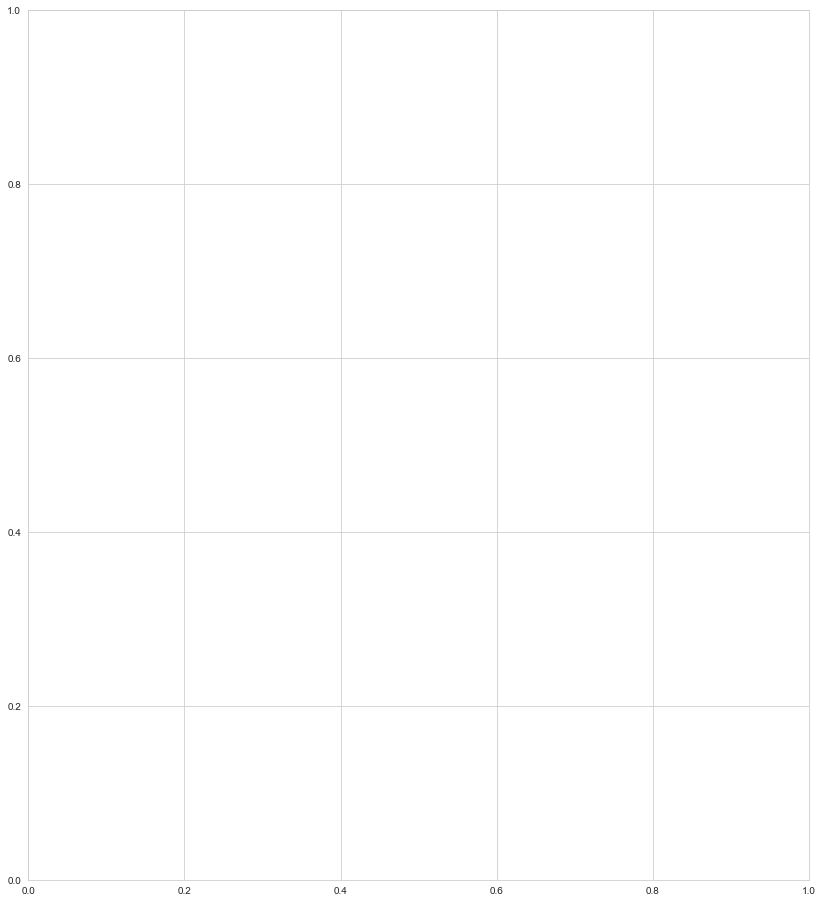

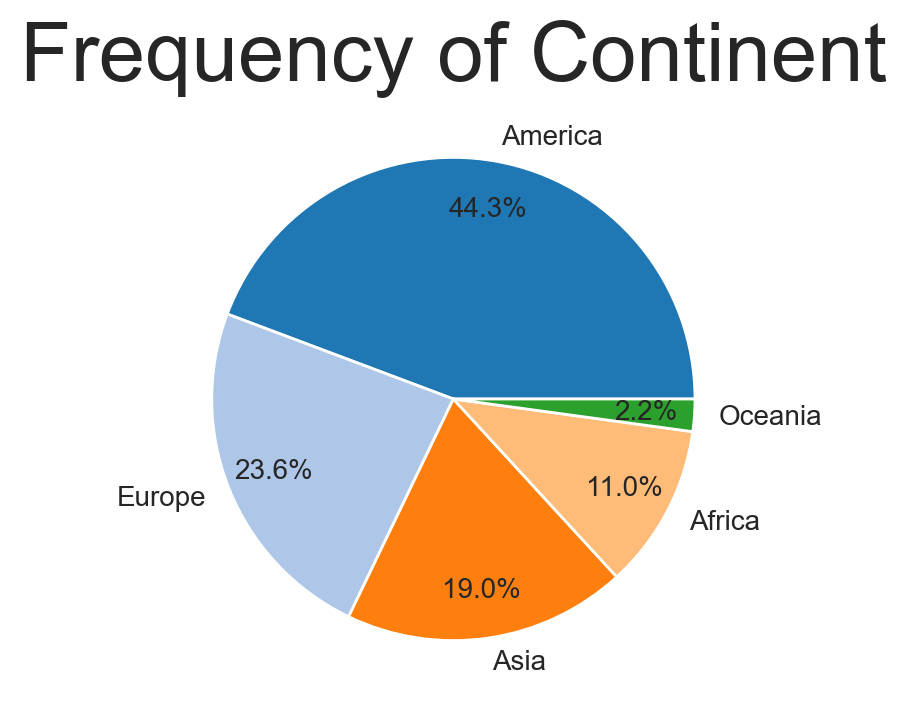

In [82]:
from matplotlib.pyplot import figure
cs = sb.color_palette("tab20")
#cs =["darkgre
# y","darkred","green","purple","aqua","blue","yellow","sienna","orangered","deeppink","springgreen","violet", "pink","dodgerblue"]
dz=dict(dataset_def["Continent"].drop(0).value_counts())
sb.set_style("whitegrid")
pie, ax = plt.subplots(figsize=[14,16])
Labels = [k for k in dz.keys()]

Data   = [float(v) for v in dz.values()]
figure(dpi=200);
plt.pie(x = Data, labels=Labels, autopct="%.1f%%", pctdistance=0.8, colors=cs);
plt.title("Frequency of Continent", fontsize=30);

<AxesSubplot:xlabel='new_aboard', ylabel='new_fatalities'>

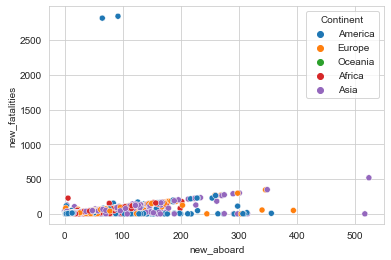

In [83]:
sb.scatterplot(x=dataset_1st["new_aboard"],y=dataset_1st["new_fatalities"], hue="Continent", data=dataset_1st)

<AxesSubplot:xlabel='new_aboard', ylabel='new_ground'>

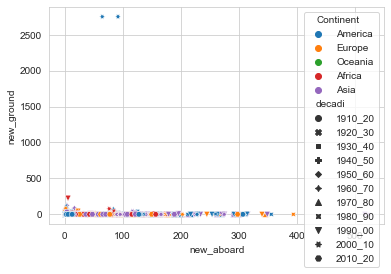

In [84]:
sb.scatterplot(sizes=200,x=dataset_1st["new_aboard"], y=dataset_1st["new_ground"], hue="Continent", style="decadi",data=dataset_1st)

<AxesSubplot:xlabel='new_aboard', ylabel='new_fatalities_passangers'>

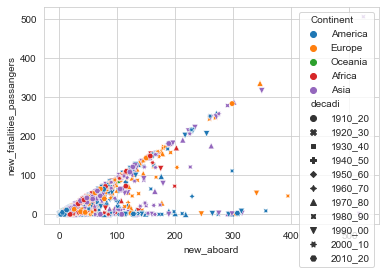

In [85]:
sb.scatterplot(sizes=200,x=dataset_1st["new_aboard"], y=dataset_1st["new_fatalities_passangers"], hue="Continent", style="decadi",data=dataset_1st)

In [ ]:
dataset_def["new_fatalities"].hist(by=dataset_def['Continent'])

## Creazione e osservazione grafi

Creiamo un dizionario con tutti i nomi degli aeroporti come chiavi e come valori gli aeroporti con i quali sono collegati.

Sistemare il codice facendo una funzione

In [86]:
univ_aerop = [i for i in dataset_def["Aeroporto_di_partenza"].unique() if type(i) != float]

for aer in dataset_def["Aeroporto_2"].unique():
    if aer not in univ_aerop and type(aer) != float: univ_aerop.append(aer)

for aer in dataset_def["Aeroporto_3"].unique():
    if aer not in univ_aerop and type(aer) != float: univ_aerop.append(aer)

for aer in dataset_def["Aeroporto_4"].unique():
    if aer not in univ_aerop and type(aer) != float: univ_aerop.append(aer)

for aer in dataset_def["Aeroporto_5"].unique():
    if aer not in univ_aerop and type(aer) != float: univ_aerop.append(aer)

for aer in dataset_def["Aeroporto_6"].unique():
    if aer not in univ_aerop and type(aer) != float: univ_aerop.append(aer)

for aer in dataset_def["Ultimo_aeroporto"].unique():
    if aer not in univ_aerop and type(aer) != float: univ_aerop.append(aer)
print(len(univ_aerop))

2057


#### Creazione lista di tuple

Creare lista di tuple che contiene i nodi e i collegamenti tra di loro a due a due. In ogni tupla ci saranno due nodi, in ordine alfabetico in modo da evitare doppioni.

In [87]:
edges = []
for aeroport in univ_aerop:
    if aeroport in aeroporto_partenza:
        for position, i in enumerate(aeroporto_partenza):
            if i == aeroport:
                mini_edge = sorted([aeroport, aeroporto_2[position]])
                if aeroporto_2[position] != "Nan" and mini_edge not in edges:
                    edges.append(mini_edge)
                elif aeroporto_2[position] == "Nan" and ultimo_aeroporto[position] != "Nan":
                    mini_edge = sorted([aeroport, ultimo_aeroporto[position]])
                    if mini_edge not in edges:
                        edges.append(mini_edge)

    elif aeroport in aeroporto_2:
        for position, i in enumerate(aeroporto_2):
            if i == aeroport:
                mini_edge = sorted([aeroport, aeroporto_3[position]])
                if aeroporto_3[position] != "Nan" and mini_edge not in edges:
                    edges.append(mini_edge)
                elif aeroporto_3[position] == "Nan" and ultimo_aeroporto[position] != "Nan":
                    mini_edge = sorted([aeroport, ultimo_aeroporto[position]])
                    if mini_edge not in edges:
                        edges.append(mini_edge)

    elif aeroport in aeroporto_3:
        for position, i in enumerate(aeroporto_3):
            if i == aeroport:
                mini_edge = sorted([aeroport, aeroporto_4[position]])
                if aeroporto_4[position] != "Nan" and mini_edge not in edges:
                    edges.append(mini_edge)
                elif aeroporto_4[position] == "Nan" and ultimo_aeroporto[position] != "Nan":
                    mini_edge = sorted([aeroport, ultimo_aeroporto[position]])
                    if mini_edge not in edges:
                        edges.append(mini_edge)

    elif aeroport in aeroporto_4:
        for position, i in enumerate(aeroporto_4):
            if i == aeroport:
                mini_edge = sorted([aeroport, aeroporto_5[position]])
                if aeroporto_5[position] != "Nan" and mini_edge not in edges:
                    edges.append(mini_edge)
                elif aeroporto_5[position] == "Nan" and ultimo_aeroporto[position] != "Nan":
                    mini_edge = sorted([aeroport, ultimo_aeroporto[position]])
                    if mini_edge not in edges:
                        edges.append(mini_edge)

    elif aeroport in aeroporto_5:
        for position, i in enumerate(aeroporto_5):
            if i == aeroport:
                mini_edge = sorted([aeroport, aeroporto_6[position]])
                if aeroporto_6[position] != "Nan" and mini_edge not in edges:
                    edges.append(mini_edge)
                elif aeroporto_6[position] == "Nan" and ultimo_aeroporto[position] != "Nan":
                    mini_edge = sorted([aeroport, ultimo_aeroporto[position]])
                    if mini_edge not in edges:
                        edges.append(mini_edge)

    elif aeroport in aeroporto_6:
        for position, i in enumerate(aeroporto_6):
            if i == aeroport:
                mini_edge = sorted([aeroport, ultimo_aeroporto[position]])
                if ultimo_aeroporto[position] != "Nan" and mini_edge not in edges:
                    edges.append(mini_edge)
                elif ultimo_aeroporto[position] == "Nan" and ultimo_aeroporto[position] != "Nan":
                    mini_edge = sorted([aeroport, ultimo_aeroporto[position]])
                    if mini_edge not in edges:
                        edges.append(mini_edge)

    elif aeroport in ultimo_aeroporto:
        for position, i in enumerate(ultimo_aeroporto):
            if i == aeroport:
                mini_edge = sorted([aeroport, ultimo_aeroporto[position]])
                if aeroporto_6[position] != "Nan":
                    edges.append(mini_edge)
                elif aeroporto_5[position] != "Nan":
                    edges.append(mini_edge)
                elif aeroporto_4[position] != "Nan":
                    edges.append(mini_edge)
                elif aeroporto_3[position] != "Nan":
                    edges.append(mini_edge)
                elif aeroporto_2[position] != "Nan":
                    edges.append(mini_edge)


print(edges)

[['Demonstration', 'Demonstration'], ['Test flight', 'Test flight'], ['Sconosciuto', 'Sconosciuto'], ['Informazione riservata', 'Informazione riservata'], ['Hounslow', 'Paris'], ['London', 'Paris'], ['Berck-sur-Mer', 'Paris'], ['Cryodon', 'Paris'], ['Paris', 'Prague'], ['Croydon', 'Paris'], ['Lyon', 'Paris'], ['Bucharest', 'Paris'], ['Morroco', 'Paris'], ['Brussels', 'Paris'], ['Paris', 'Toulouse'], ['Paris', 'Prauge'], ['Casablanca', 'Paris'], ['Cairo', 'Paris'], ['Paris', 'Shannon'], ['Bordeaux', 'Paris'], ['Paris', 'Vichy'], ['Copenhagen', 'Paris'], ['Paris', 'Santa Maria'], ['Lyons', 'Paris'], ['Dakar', 'Paris'], ['Paris', 'Rome'], ['Nice', 'Paris'], ['Paris', 'Rabat'], ['New York City', 'Paris'], ['Paris', 'Pointe-a Pitre'], ['Jersey', 'Paris'], ['Paris', 'Zurich'], ['Orange', 'Paris'], ['Paris', 'Tanger'], ['Agadir', 'Paris'], ['Niamey', 'Paris'], ['Paris', 'Seoul'], ['Madrid', 'Paris'], ['Paris', 'Valence'], ['Paris', 'Romania'], ['Paris', 'Toronto Canada'], ['Newark', 'Washingt

In [88]:
dataset_def

,New_Operator_column,Aeroporto_di_partenza,Aeroporto_2,Aeroporto_3,Aeroporto_4,Aeroporto_5,Aeroporto_6,Ultimo_aeroporto,AC_Type_simplified,Year,...,new_fatalities_passangers,new_ground,new_aboard,new_aboard_crew,new_aboard_passangers,States,Sub_Regions,Continent,State_Aeroporto_di_partenza,Continent_Aeroporto_di_partenza
0,Military flight,Demonstration,Nan,Nan,Nan,Nan,Nan,Demonstration,WRIGHT FLYER III,1908.0,...,1.0,0.0,2.0,1.0,1.0,United States,Northern America,America,Demonstration,Sconosciuto
2,Military flight,Test flight,Nan,Nan,Nan,Nan,Nan,Test flight,Dirigible,1912.0,...,0.0,0.0,5.0,5.0,0.0,United States,Northern America,America,Test flight,America
3,Private flights,Sconosciuto,Nan,Nan,Nan,Nan,Nan,Sconosciuto,CURTISS SEAPLANE,1913.0,...,0.0,0.0,1.0,1.0,0.0,Canada,Northern America,America,Sconosciuto,Sconosciuto
10,Military flight,Informazione riservata,Nan,Nan,Nan,Nan,Nan,Informazione riservata,ZEPPELIN,1916.0,...,0.0,0.0,19.0,19.0,0.0,United Kingdom,Northern Europe,Europe,Informazione riservata,Sconosciuto
23,Postal/Cargo flight,Sconosciuto,Nan,Nan,Nan,Nan,Nan,Sconosciuto,DE HAVILLAND,1918.0,...,0.0,0.0,1.0,1.0,0.0,United States,Northern America,America,Sconosciuto,Sconosciuto
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4960,Scheduled flight,San Jose,Nan,Nan,Nan,Nan,Nan,Villavicencio,DOUGLAS,2019.0,...,11.0,0.0,14.0,3.0,11.0,Colombia,Latin America and the Caribbean,America,Philippines,Asia
4961,Scheduled flight,Addis Ababa,Nan,Nan,Nan,Nan,Nan,Nairobi,BOEING 737 MAX 8,2019.0,...,149.0,0.0,157.0,8.0,149.0,Ethiopia,Sub-Saharan Africa,Africa,Ethiopia,Africa
4962,Scheduled flight,Puerto Montt,Nan,Nan,Nan,Nan,Nan,Ayacara,PILATUS-BRITTEN NORMAN,2019.0,...,5.0,0.0,6.0,1.0,5.0,Chile,Latin America and the Caribbean,America,Chile,America
4963,Scheduled flight,Las Vegas,Nan,Nan,Nan,Nan,Nan,Monterrey,CANADAIR,2019.0,...,11.0,0.0,13.0,2.0,11.0,United States,Northern America,America,Honduras,America


### Rotta più pericolosa

##### State_Aeroporto_di_partenza - States

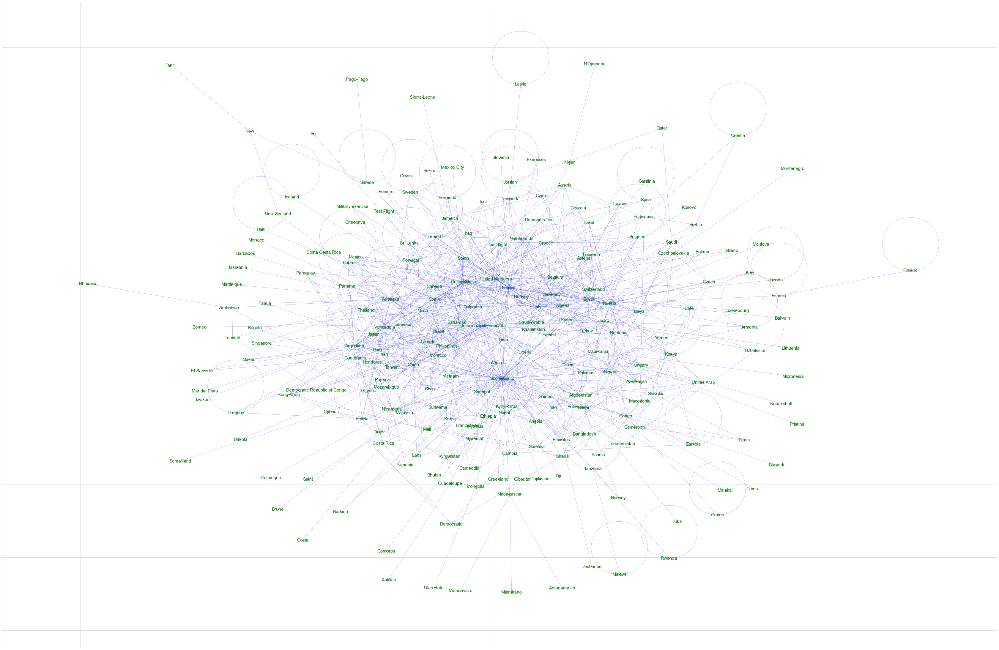

In [89]:
plt.figure(figsize=(60, 40))

graph = nx.from_pandas_edgelist(dataset_def, source="State_Aeroporto_di_partenza", target="States")

pos = nx.kamada_kawai_layout(graph)

node_options = {'node_color':'red', 'node_size':10}

edge_options = {'width':.50, 'alpha':.5, 'edge_color':'blue'}

node_label_options = {'font_size': 15,
                      'font_color':'green'
                    }

nx.draw_networkx_nodes(graph, pos, **node_options)
nx.draw_networkx_edges(graph, pos, **edge_options)
nx.draw_networkx_labels(graph, pos, **node_label_options)

plt.show()

##### Continent_Aeroporto_di_partenza - Continent

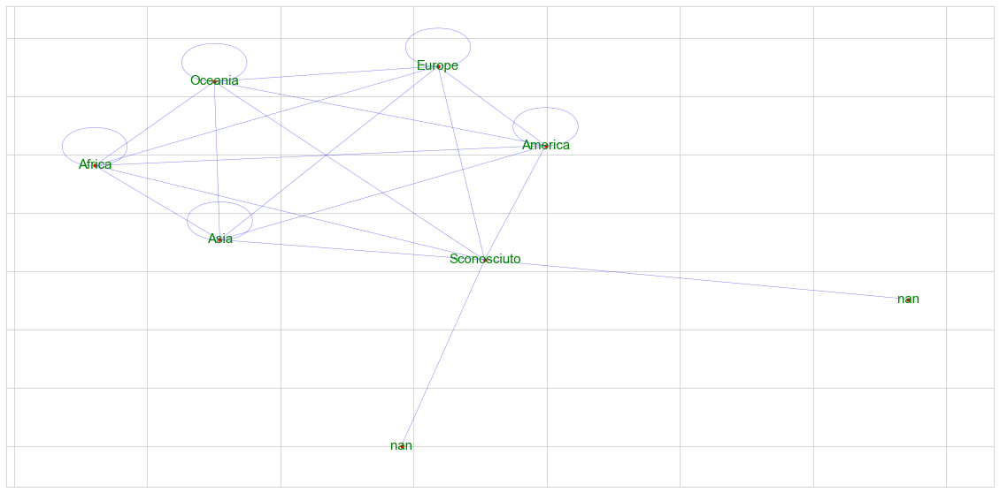

In [91]:
plt.figure(figsize=(20, 10))

graph = nx.from_pandas_edgelist(dataset_def, source="Continent_Aeroporto_di_partenza", target="Continent")

pos = nx.kamada_kawai_layout(graph)

node_options = {'node_color':'red', 'node_size':10}

edge_options = {'width':.50, 'alpha':.5, 'edge_color':'blue'}

node_label_options = {'font_size': 15,
                      'font_color':'green'
                    }

nx.draw_networkx_nodes(graph, pos, **node_options)
nx.draw_networkx_edges(graph, pos, **edge_options)
nx.draw_networkx_labels(graph, pos, **node_label_options)

plt.show()

### Tipo di aereo più pericoloso (In quali stati sono caduti più tipi di aereo e di che tipologia erano?)

##### States - Ac_type_operator

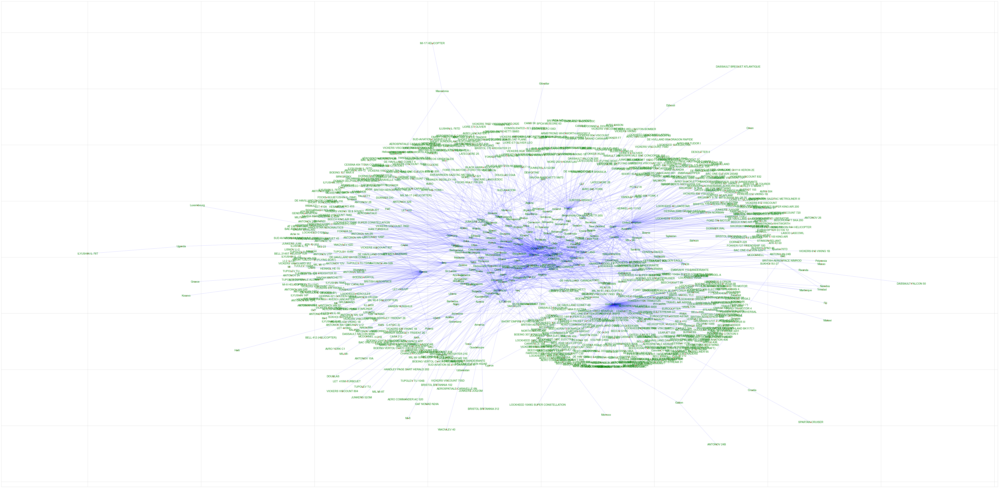

In [92]:
plt.figure(figsize=(100, 50))

graph = nx.from_pandas_edgelist(dataset_def, source="States", target="AC_Type_simplified")

pos = nx.kamada_kawai_layout(graph)

node_options = {'node_color':'red', 'node_size':10}

edge_options = {'width':.50, 'alpha':.5, 'edge_color':'blue'}

node_label_options = {'font_size': 15,
                      'font_color':'green'
                    }

nx.draw_networkx_nodes(graph, pos, **node_options)
nx.draw_networkx_edges(graph, pos, **edge_options)
nx.draw_networkx_labels(graph, pos, **node_label_options)

plt.show()

##### Sub_regions - Ac_type_operator

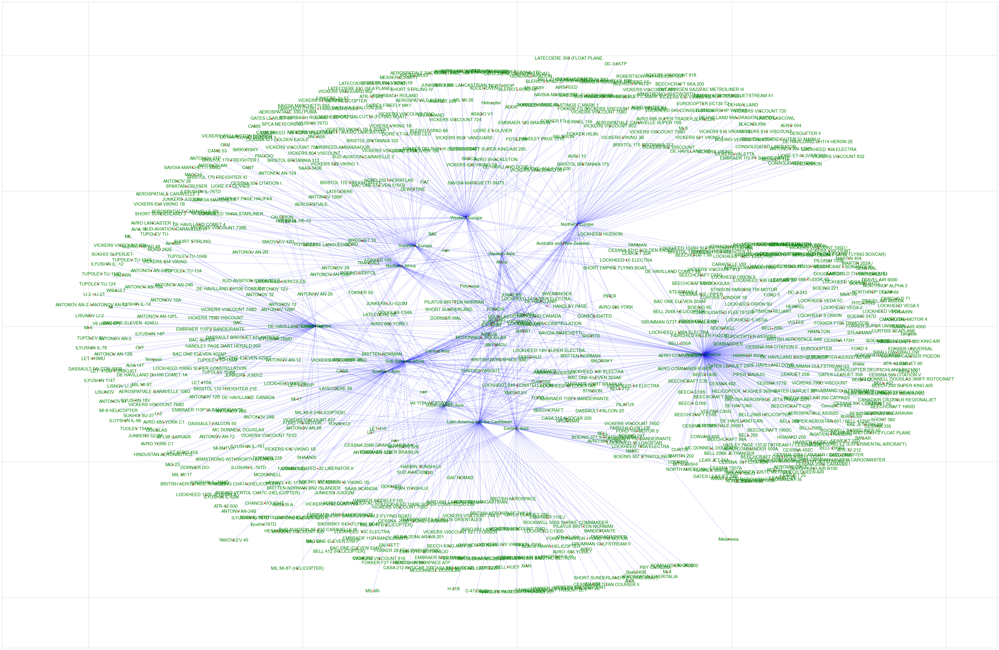

In [93]:
plt.figure(figsize=(60, 40))

graph = nx.from_pandas_edgelist(dataset_def, source="Sub_Regions", target="AC_Type_simplified")

pos = nx.kamada_kawai_layout(graph)

node_options = {'node_color':'red', 'node_size':10}

edge_options = {'width':.50, 'alpha':.5, 'edge_color':'blue'}

node_label_options = {'font_size': 15,
                      'font_color':'green'
                    }

nx.draw_networkx_nodes(graph, pos, **node_options)
nx.draw_networkx_edges(graph, pos, **edge_options)
nx.draw_networkx_labels(graph, pos, **node_label_options)

plt.show()

##### Continent - Ac_type_operator

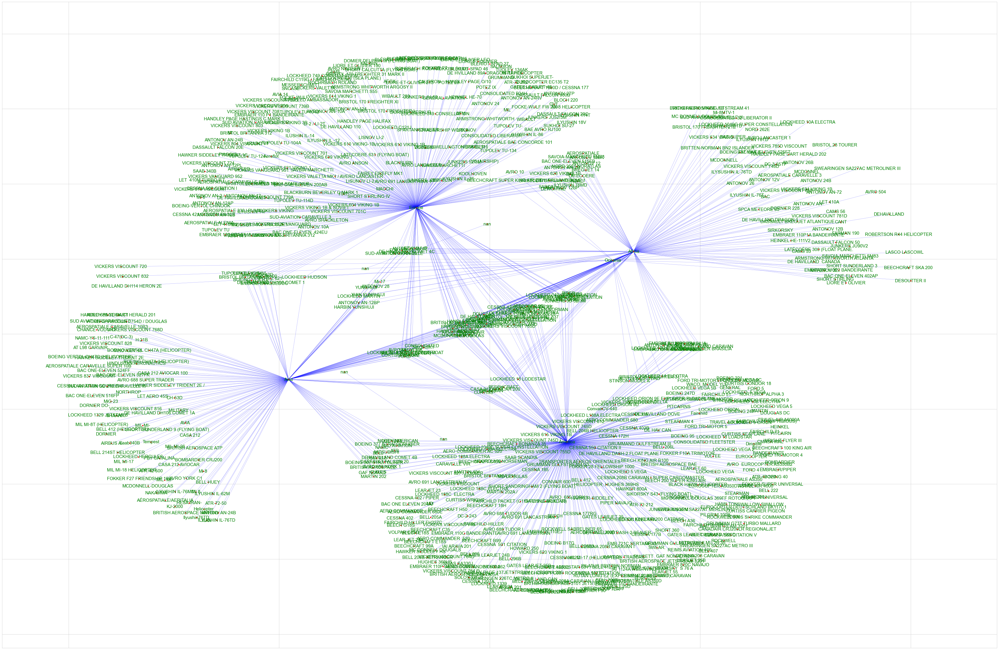

In [94]:
plt.figure(figsize=(60, 40))

graph = nx.from_pandas_edgelist(dataset_def, source="Continent", target="AC_Type_simplified")

pos = nx.kamada_kawai_layout(graph)

node_options = {'node_color':'red', 'node_size':10}

edge_options = {'width':.50, 'alpha':.5, 'edge_color':'blue'}

node_label_options = {'font_size': 15,
                      'font_color':'green'
                    }

nx.draw_networkx_nodes(graph, pos, **node_options)
nx.draw_networkx_edges(graph, pos, **edge_options)
nx.draw_networkx_labels(graph, pos, **node_label_options)

plt.show()

### Tipo di volo che più pericoloso

##### States - New_Operator

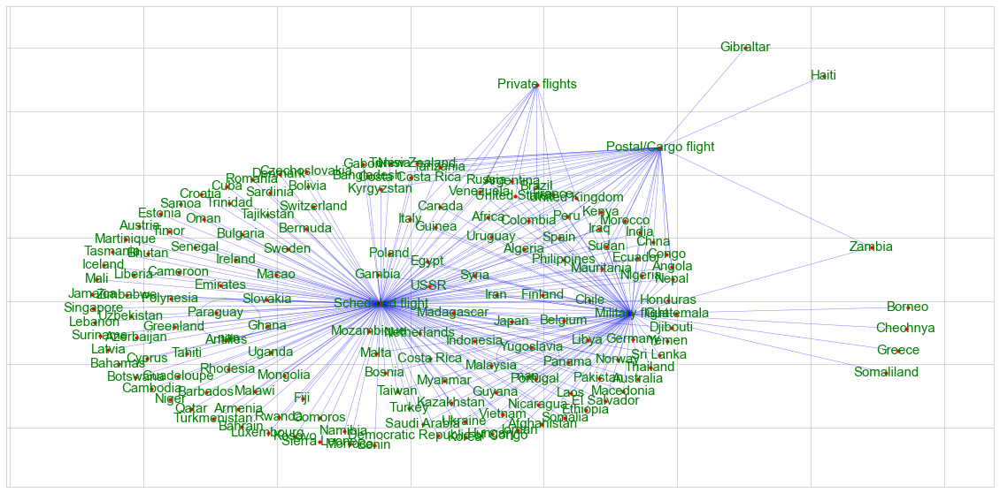

In [95]:
plt.figure(figsize=(20, 10))

graph = nx.from_pandas_edgelist(dataset_def, source="States", target="New_Operator_column")

pos = nx.kamada_kawai_layout(graph)

node_options = {'node_color':'red', 'node_size':10}

edge_options = {'width':.50, 'alpha':.5, 'edge_color':'blue'}

node_label_options = {'font_size': 15,
                      'font_color':'green'
                    }

nx.draw_networkx_nodes(graph, pos, **node_options)
nx.draw_networkx_edges(graph, pos, **edge_options)
nx.draw_networkx_labels(graph, pos, **node_label_options)

plt.show()

##### Sub_Region - New Operator

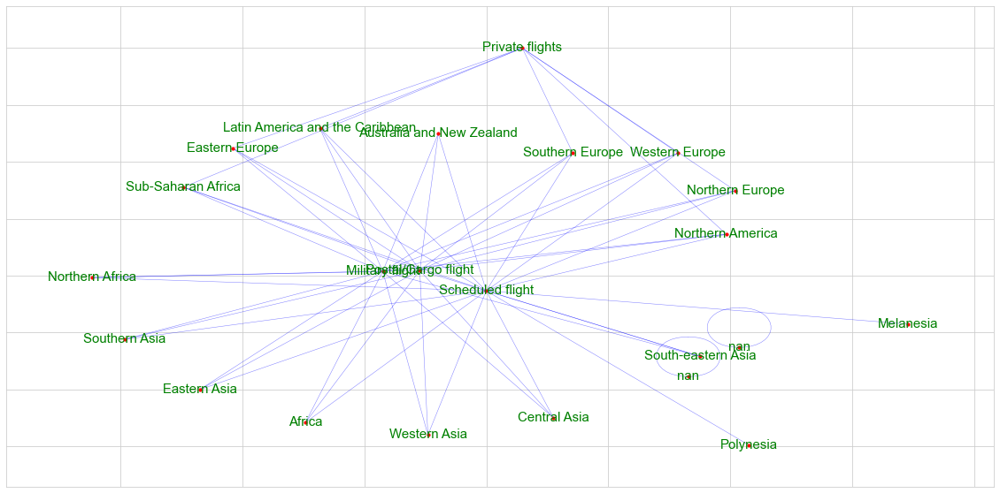

In [96]:
plt.figure(figsize=(20, 10))

graph = nx.from_pandas_edgelist(dataset_def, source="Sub_Regions", target="New_Operator_column")

pos = nx.kamada_kawai_layout(graph)

node_options = {'node_color':'red', 'node_size':10}

edge_options = {'width':.50, 'alpha':.5, 'edge_color':'blue'}

node_label_options = {'font_size': 15,
                      'font_color':'green'
                    }

nx.draw_networkx_nodes(graph, pos, **node_options)
nx.draw_networkx_edges(graph, pos, **edge_options)
nx.draw_networkx_labels(graph, pos, **node_label_options)

plt.show()

##### Continent - New Operator

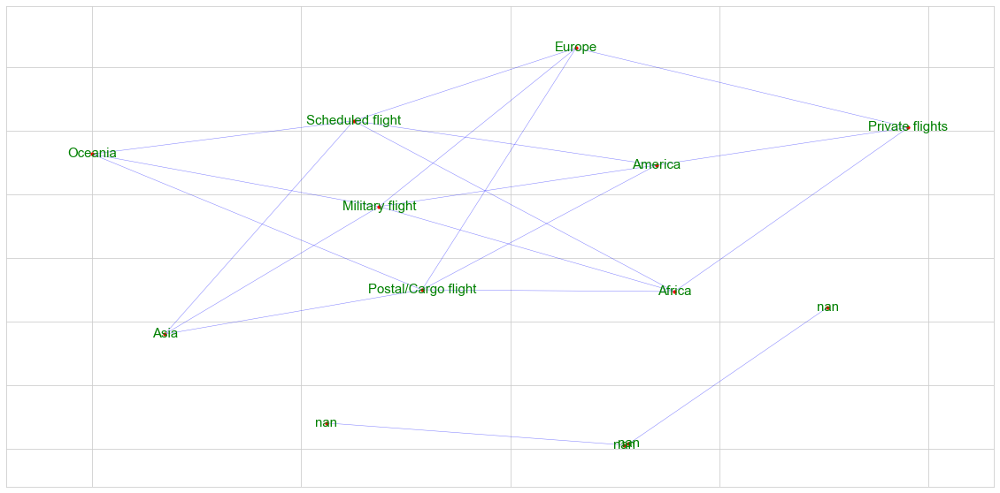

In [97]:
plt.figure(figsize=(20, 10))

graph = nx.from_pandas_edgelist(dataset_def, source="Continent", target="New_Operator_column")

pos = nx.kamada_kawai_layout(graph)

node_options = {'node_color':'red', 'node_size':10}

edge_options = {'width':.50, 'alpha':.5, 'edge_color':'blue'}

node_label_options = {'font_size': 15,
                      'font_color':'green'
                    }

nx.draw_networkx_nodes(graph, pos, **node_options)
nx.draw_networkx_edges(graph, pos, **edge_options)
nx.draw_networkx_labels(graph, pos, **node_label_options)

plt.show()

##### I tipi di aereo caduti, da quale stato sono partiti?

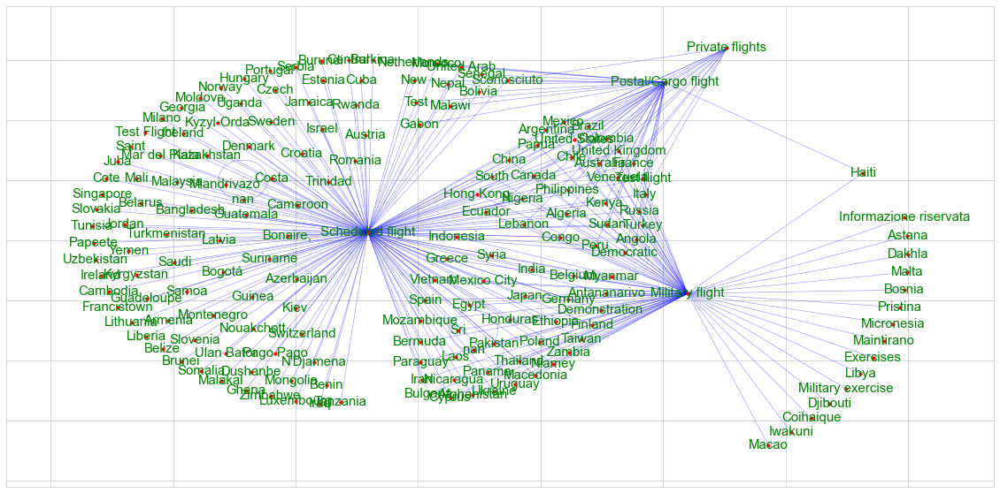

In [98]:
plt.figure(figsize=(20, 10))

graph = nx.from_pandas_edgelist(dataset_def, source="State_Aeroporto_di_partenza", target="New_Operator_column")

pos = nx.kamada_kawai_layout(graph)

node_options = {'node_color':'red', 'node_size':10}

edge_options = {'width':.50, 'alpha':.5, 'edge_color':'blue'}

node_label_options = {'font_size': 15,
                      'font_color':'green'
                    }

nx.draw_networkx_nodes(graph, pos, **node_options)
nx.draw_networkx_edges(graph, pos, **edge_options)
nx.draw_networkx_labels(graph, pos, **node_label_options)

plt.show()